# Projet Machine Learning :  
    - MARHOUM AHMED ZINE EDDINE 2CS3 AI&DS

    - MEZGHICHE WISSAL 2CS1 AI&DS
    
    - ZEROUK MOHAMED LAMINE 2CS2 AI&DS

Voici une description de  jeu de données **Kepler**  que nous avons utilisé:

---

**Contexte:**
Le télescope spatial Kepler est un satellite construit par la **NASA** qui a été lancé en 2009. Le télescope est dédié à la recherche d'exoplanètes dans des systèmes stellaires autres que le nôtre, dans le but ultime de trouver éventuellement d'autres planètes habitables que la nôtre. La mission originale a pris fin en 2013 en raison de pannes mécaniques, mais le télescope est néanmoins fonctionnel depuis 2014 dans le cadre d'une mission prolongée appelée **"K2"**.

À ce jour, **Kepler** a vérifié l'existence de 1284 nouvelles exoplanètes jusqu'en mai 2016. En octobre 2017, il y a plus de 3000 exoplanètes confirmées au total (en utilisant toutes les méthodes de détection, y compris les méthodes terrestres). Le télescope est toujours actif et continue de collecter de nouvelles données dans le cadre de sa mission prolongée.

**Contenu:**
Ce jeu de données est un enregistrement cumulatif de tous les "objets d'intérêt" observés par **Kepler** - essentiellement toutes les candidats exoplanétaires sur lesquels **Kepler** a pris des observations. 

Le jeu de données comprend un dictionnaire de données détaillé, qui peut être consulté [ici](lien_vers_dictionnaire_de_données). 

**Sources:**
Ce jeu de données a été publié tel quel par la **NASA**. Vous pouvez accéder à la table originale [ici](lien_vers_tableau_original). Plus de données provenant de la mission Kepler sont disponibles à la même source [ici](lien_vers_plus_de_données).

**Inspiration:**
À quelle fréquence les exoplanètes confirmées dans la littérature sont-elles contredites par des mesures de **Kepler** ? Et vice versa ? Quelles caractéristiques générales sur les exoplanètes (que nous pouvons trouver) pouvez-vous déduire de ce jeu de données ? Quelles exoplanètes se voient attribuer des noms dans la littérature ? Quelle est la distribution des scores de confiance ?

---

In [1]:
import pandas as pd
import pprint
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler,OneHotEncoder
from sklearn.impute import SimpleImputer
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.metrics import accuracy_score 
from sklearn.metrics import classification_report 
from sklearn.decomposition import PCA
from sklearn.model_selection import  KFold, StratifiedKFold, cross_val_score
from yellowbrick.model_selection import LearningCurve 
from yellowbrick.model_selection import  CVScores
from sklearn.metrics import confusion_matrix, balanced_accuracy_score, classification_report, cohen_kappa_score, f1_score
from sklearn.metrics import roc_auc_score, roc_curve
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Dense
from tensorflow.keras.optimizers import Adam
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score
from sklearn.base import BaseEstimator, ClassifierMixin
import numpy as np
import plotly.express as px

In [2]:
pp = pprint.PrettyPrinter(indent = 3)

# 1ere Partie : 
---

# Nettoyage des données

Dans cette première étape de notre analyse, nous allons effectuer le nettoyage des données afin de préparer notre jeu de données pour les étapes suivantes. Le processus de nettoyage des données est crucial pour garantir la qualité et la fiabilité de nos résultats.

## Étapes de nettoyage des données :

1. **Identification des valeurs manquantes** : Nous examinerons les données pour repérer les valeurs manquantes et déciderons de la meilleure façon de les gérer.

2. **Gestion des valeurs manquantes** : Nous utiliserons différentes stratégies telles que l'imputation ou la suppression des valeurs manquantes en fonction du contexte de chaque attribut.

3. **Identification et gestion des valeurs aberrantes** : Nous examinerons les données pour détecter les valeurs aberrantes qui pourraient fausser nos résultats, et nous déciderons de la manière de les traiter.

4. **Conversion des types de données** : Si nécessaire, nous convertirons les types de données des attributs pour les rendre compatibles avec les méthodes d'analyse que nous prévoyons d'utiliser.

5. **Exploration des duplicatas** : Nous vérifierons s'il existe des lignes dupliquées dans nos données et les supprimerons si nécessaire.

Une fois que nous aurons terminé ces étapes, nous disposerons d'un jeu de données propre et prêt à être exploré et analysé.


In [3]:
data = pd.read_csv("C:/Users/DELL Latitude 5330/Desktop/PROJ_ML/kepler-data.csv")

In [5]:
#data.columns

| Colonnes            | Description                                                                                                                                                          |
|---------------------|----------------------------------------------------------------------------------------------------------------------------------------------------------------------|
| rowid               | Identifiant de la ligne.                                                                                                                                             |
| kepid               | Identifiant unique pour chaque objet Kepler (KOI).                                                                                                                  |
| kepoi_name          | Nom du KOI (Kepler Object of Interest).                                                                                                                             |
| kepler_name         | Nom donné par le télescope Kepler aux objets confirmés ou validés en tant que planètes.                                                                             |
| koi_disposition     | Disposition de l'exoplanète candidate dans la littérature. Peut être CANDIDATE, FALSE POSITIVE, NOT DISPOSITIONED ou CONFIRMED.                                        |
| koi_pdisposition    | Disposition de l'analyse des données de Kepler envers cette exoplanète candidate. Peut être FALSE POSITIVE, NOT DISPOSITIONED ou CANDIDATE.                           |
| koi_score           | Valeur entre 0 et 1 indiquant la confiance dans la disposition du KOI. Pour les CANDIDATEs, une valeur plus élevée indique plus de confiance dans sa disposition.  |
| koi_fpflag_nt       | Indicateur de drapeau faux positif : transit de barycentrage en orbite.                                                                                             |
| koi_fpflag_ss       | Indicateur de drapeau faux positif : étoile saturée.                                                                                                                |
| koi_fpflag_co       | Indicateur de drapeau faux positif : contamination de couleur                                                                                                       |
| koi_fpflag_ec       | Indicateur de drapeau faux positif : éclipse du compagnon.                                                                                                          |
| koi_period          | Période orbitale de l'exoplanète candidate en jours.                                                                                                                 |
| koi_period_err1     | Erreur positive sur la période orbitale.                                                                                                                             |
| koi_period_err2     | Erreur négative sur la période orbitale.                                                                                                                             |
| koi_time0bk         | Temps au centre du premier transit en BKJD.                                                                                                                          |
| koi_time0bk_err1    | Erreur positive sur le temps au centre du premier transit.                                                                                                           |
| koi_time0bk_err2    | Erreur négative sur le temps au centre du premier transit.                                                                                                           |
| koi_impact          | Paramètre d'impact stellaire de l'exoplanète.                                                                                                                        |
| koi_impact_err1     | Erreur positive sur le paramètre d'impact stellaire.                                                                                                                  |
| koi_impact_err2     | Erreur négative sur le paramètre d'impact stellaire.                                                                                                                  |
| koi_duration        | Durée totale de transit en heures.                                                                                                                                   |
| koi_duration_err1   | Erreur positive sur la durée totale de transit.                                                                                                                       |
| koi_duration_err2   | Erreur négative sur la durée totale de transit.                                                                                                                       |
| koi_depth           | Profondeur du transit en parties par million (ppm).                                                                                                                   |
| koi_depth_err1      | Erreur positive sur la profondeur du transit.                                                                                                                         |
| koi_depth_err2      | Erreur négative sur la profondeur du transit.                                                                                                                         |
| koi_prad            | Rayon planétaire en rayons terrestres.                                                                                                                               |
| koi_prad_err1       | Erreur positive sur le rayon planétaire.                                                                                                                             |
| koi_prad_err2       | Erreur négative sur le rayon planétaire.                                                                                                                             |
| koi_teq             | Température d'équilibre en Kelvin.                                                                                                                                   |
| koi_teq_err1        | Erreur positive sur la température d'équilibre.                                                                                                                      |
| koi_teq_err2        | Erreur négative sur la température d'équilibre.                                                                                                                      |
| koi_insol           | Flux d'irradiance en flux solaire.                                                                                                                                   |
| koi_insol_err1      | Erreur positive sur le flux d'irradiance.                                                                                                                            |
| koi_insol_err2      | Erreur négative sur le flux d'irradiance.                                                                                                                            |
| koi_model_snr       | Rapport signal/bruit modèle KOI.                                                                                                                                    |
| koi_tce_plnt_num    | Numéro de la planète dans le système multi-planétaire.                                                                                                               |
| koi_tce_delivname   | Nom du livrable produit par le pipeline de vérification de candidats KOI.                                                                                            |
| koi_steff           | Température effective de l'étoile en Kelvin.                                                                                                                         |
| koi_steff_err1      | Erreur positive sur la température effective de l'étoile.                                                                                                             |
| koi_steff_err2      | Erreur négative sur la température effective de l'étoile.                                                                                                             |
| koi_slogg           | Gravité de surface logarithmique de l'étoile.                                                                                                                        |
| koi_slogg_err1      | Erreur positive sur la gravité de surface logarithmique de l'étoile.                                                                                                  |
| koi_slogg_err2      | Erreur négative sur la gravité de surface logarithmique de l'étoile.                                                                                                  |
| koi_srad            | Rayon stellaire en rayons solaires.                                                                                                                                  |
| koi_srad_err1       | Erreur positive sur le rayon stellaire.                                                                                                                               |
| koi_srad_err2       | Erreur négative sur le rayon stellaire.                                                                                                                               |
| ra                  | Ascension droite de l'objet en degrés.                                                                                                                               |
| dec                 | Déclinaison de l'objet en degrés.                                                                                                                                    |
| koi_kepmag          | Magnitude apparente de l'objet dans le domaine visible.                                                                                                              |


In [10]:
data.shape

(9564, 50)


|            | Valeur |
|------------|--------|
| Lignes   | 9564   |
| Colonnes     | 50     |

<Axes: ylabel='count'>

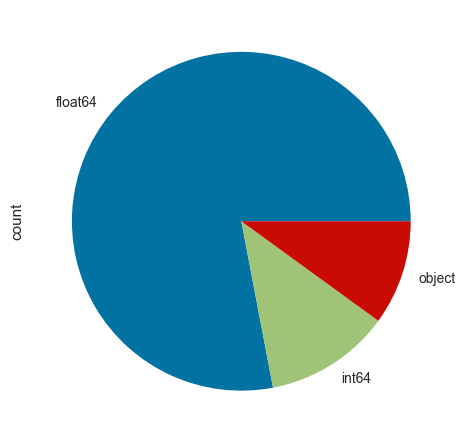

In [11]:
data.dtypes.value_counts().plot.pie()

In [12]:
data.head()

,rowid,kepid,kepoi_name,kepler_name,koi_disposition,koi_pdisposition,koi_score,koi_fpflag_nt,koi_fpflag_ss,koi_fpflag_co,...,koi_steff_err2,koi_slogg,koi_slogg_err1,koi_slogg_err2,koi_srad,koi_srad_err1,koi_srad_err2,ra,dec,koi_kepmag
0,1,10797460,K00752.01,Kepler-227 b,CONFIRMED,CANDIDATE,1.000,0,0,0,...,-81.0,4.467,0.064,-0.096,0.927,0.105,-0.061,291.93423,48.141651,15.347
1,2,10797460,K00752.02,Kepler-227 c,CONFIRMED,CANDIDATE,0.969,0,0,0,...,-81.0,4.467,0.064,-0.096,0.927,0.105,-0.061,291.93423,48.141651,15.347
2,3,10811496,K00753.01,NaN,FALSE POSITIVE,FALSE POSITIVE,0.000,0,1,0,...,-176.0,4.544,0.044,-0.176,0.868,0.233,-0.078,297.00482,48.134129,15.436
3,4,10848459,K00754.01,NaN,FALSE POSITIVE,FALSE POSITIVE,0.000,0,1,0,...,-174.0,4.564,0.053,-0.168,0.791,0.201,-0.067,285.53461,48.285210,15.597
4,5,10854555,K00755.01,Kepler-664 b,CONFIRMED,CANDIDATE,1.000,0,0,0,...,-211.0,4.438,0.070,-0.210,1.046,0.334,-0.133,288.75488,48.226200,15.509


In [13]:
data.tail()

,rowid,kepid,kepoi_name,kepler_name,koi_disposition,koi_pdisposition,koi_score,koi_fpflag_nt,koi_fpflag_ss,koi_fpflag_co,...,koi_steff_err2,koi_slogg,koi_slogg_err1,koi_slogg_err2,koi_srad,koi_srad_err1,koi_srad_err2,ra,dec,koi_kepmag
9559,9560,10031643,K07984.01,NaN,FALSE POSITIVE,FALSE POSITIVE,0.000,0,0,0,...,-152.0,4.296,0.231,-0.189,1.088,0.313,-0.228,298.74921,46.973351,14.478
9560,9561,10090151,K07985.01,NaN,FALSE POSITIVE,FALSE POSITIVE,0.000,0,1,1,...,-166.0,4.529,0.035,-0.196,0.903,0.237,-0.079,297.18875,47.093819,14.082
9561,9562,10128825,K07986.01,NaN,CANDIDATE,CANDIDATE,0.497,0,0,0,...,-220.0,4.444,0.056,-0.224,1.031,0.341,-0.114,286.50937,47.163219,14.757
9562,9563,10147276,K07987.01,NaN,FALSE POSITIVE,FALSE POSITIVE,0.021,0,0,1,...,-236.0,4.447,0.056,-0.224,1.041,0.341,-0.114,294.16489,47.176281,15.385
9563,9564,10156110,K07989.01,NaN,FALSE POSITIVE,FALSE POSITIVE,0.000,0,0,1,...,-225.0,4.385,0.054,-0.216,1.193,0.410,-0.137,297.00977,47.121021,14.826


In [14]:
data.describe()

,rowid,kepid,koi_score,koi_fpflag_nt,koi_fpflag_ss,koi_fpflag_co,koi_fpflag_ec,koi_period,koi_period_err1,koi_period_err2,...,koi_steff_err2,koi_slogg,koi_slogg_err1,koi_slogg_err2,koi_srad,koi_srad_err1,koi_srad_err2,ra,dec,koi_kepmag
count,9564.000000,9.564000e+03,8054.000000,9564.000000,9564.000000,9564.000000,9564.000000,9564.000000,9110.000000,9110.000000,...,9081.000000,9201.000000,9096.000000,9096.000000,9201.000000,9096.000000,9096.000000,9564.000000,9564.000000,9563.000000
mean,4782.500000,7.690628e+06,0.480829,0.188206,0.231598,0.194898,0.120033,75.671358,0.002148,-0.002148,...,-162.265059,4.310157,0.120738,-0.143161,1.728712,0.362292,-0.394806,292.060163,43.810433,14.264606
std,2761.033321,2.653459e+06,0.476928,0.390897,0.421875,0.396143,0.325018,1334.744046,0.008236,0.008236,...,72.746348,0.432606,0.132837,0.085477,6.127185,0.930870,2.168213,4.766657,3.601243,1.385448
min,1.000000,7.574500e+05,0.000000,0.000000,0.000000,0.000000,0.000000,0.241843,0.000000,-0.172500,...,-1762.000000,0.047000,0.000000,-1.207000,0.109000,0.000000,-116.137000,279.852720,36.577381,6.966000
25%,2391.750000,5.556034e+06,0.000000,0.000000,0.000000,0.000000,0.000000,2.733684,0.000005,-0.000276,...,-198.000000,4.218000,0.042000,-0.196000,0.829000,0.129000,-0.250000,288.660770,40.777173,13.440000
50%,4782.500000,7.906892e+06,0.334000,0.000000,0.000000,0.000000,0.000000,9.752831,0.000035,-0.000035,...,-160.000000,4.438000,0.070000,-0.128000,1.000000,0.251000,-0.111000,292.261125,43.677504,14.520000
75%,7173.250000,9.873066e+06,0.998000,0.000000,0.000000,0.000000,0.000000,40.715178,0.000276,-0.000005,...,-114.000000,4.543000,0.149000,-0.088000,1.345000,0.364000,-0.069000,295.859160,46.714611,15.322000
max,9564.000000,1.293514e+07,1.000000,1.000000,1.000000,1.000000,1.000000,129995.778400,0.172500,0.000000,...,0.000000,5.364000,1.472000,0.000000,229.908000,33.091000,0.000000,301.720760,52.336010,20.003000


In [15]:
fig = px.histogram(data, x="koi_period") 
fig.show()

In [16]:
fig = px.histogram(data, x="koi_score") 
fig.show()

In [17]:
fig = px.histogram(data, x="koi_fpflag_nt") 
fig.show()

In [18]:
fig = px.histogram(data, x="koi_fpflag_ss") 
fig.show()

In [19]:
fig = px.histogram(data, x="koi_fpflag_co") 
fig.show()

In [20]:
fig = px.histogram(data, x="koi_fpflag_ec") 
fig.show()

In [21]:
fig = px.histogram(data, x="koi_period_err1") 
fig.show()

In [18]:
fig = px.histogram(data, x="koi_period_err2") 
fig.show()

In [19]:
fig = px.histogram(data, x="koi_time0bk_err1") 
fig.show()

In [20]:
fig = px.histogram(data, x="koi_time0bk_err2") 
fig.show()

In [21]:
fig = px.histogram(data, x="koi_impact") 
fig.show()

In [22]:
fig = px.histogram(data, x="koi_impact_err1") 
fig.show()

In [23]:
fig = px.histogram(data, x="koi_impact_err2") 
fig.show()

In [24]:
fig = px.histogram(data, x="koi_duration") 
fig.show()

In [25]:
fig = px.histogram(data, x="koi_duration_err1") 
fig.show()

In [26]:
fig = px.histogram(data, x="koi_duration_err2") 
fig.show()

In [27]:
fig = px.histogram(data, x="koi_depth") 
fig.show()

In [28]:
fig = px.histogram(data, x="koi_depth_err1") 
fig.show()

In [29]:
fig = px.histogram(data, x="koi_depth_err2") 
fig.show()

In [30]:
fig = px.histogram(data, x="koi_prad") 
fig.show()

In [31]:
fig = px.histogram(data, x="koi_prad_err1") 
fig.show()

In [32]:
fig = px.histogram(data, x="koi_prad_err2") 
fig.show()

In [33]:
fig = px.histogram(data, x="koi_teq") 
fig.show()

In [34]:
fig = px.histogram(data, x="koi_insol") 
fig.show()

In [35]:
fig = px.histogram(data, x="koi_tce_plnt_num") 
fig.show()

In [36]:
fig = px.histogram(data, x="koi_tce_delivname") 
fig.show()

In [37]:
fig = px.histogram(data, x="koi_steff") 
fig.show()

In [38]:
fig = px.histogram(data, x="koi_slogg") 
fig.show()

In [39]:
fig = px.histogram(data, x="koi_srad") 
fig.show()

In [40]:
fig = px.histogram(data, x="ra") 
fig.show()

In [41]:
fig = px.histogram(data, x="dec") 
fig.show()

In [42]:
fig = px.histogram(data, x="koi_kepmag") 
fig.show()

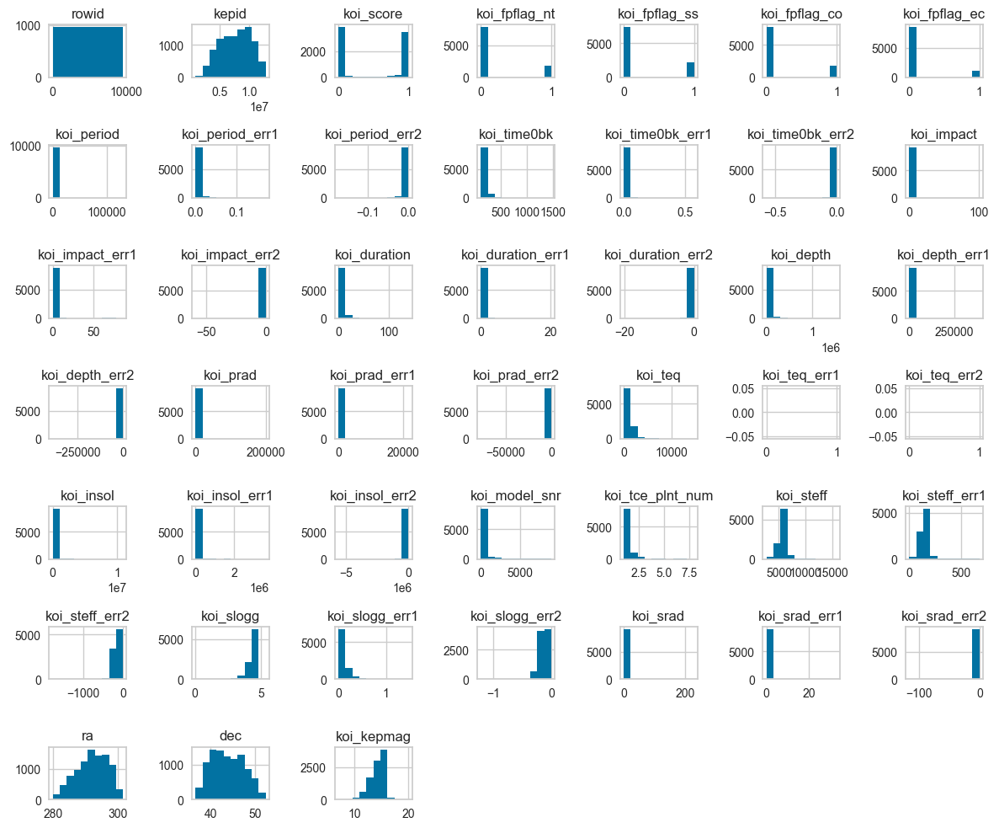

In [43]:
data.hist(figsize=(12, 10))
plt.tight_layout()
plt.show() 

In [98]:
fig = px.pie(data, values='koi_score', names='koi_disposition')
fig.show()

In [99]:
fig = px.pie(data, values='koi_score', names='koi_pdisposition')
fig.show()

In [9]:
fig = px.histogram(data, x="koi_pdisposition", template="seaborn")
fig.show()

In [10]:
fig = px.histogram(data, x="koi_disposition", template="seaborn")
fig.show()

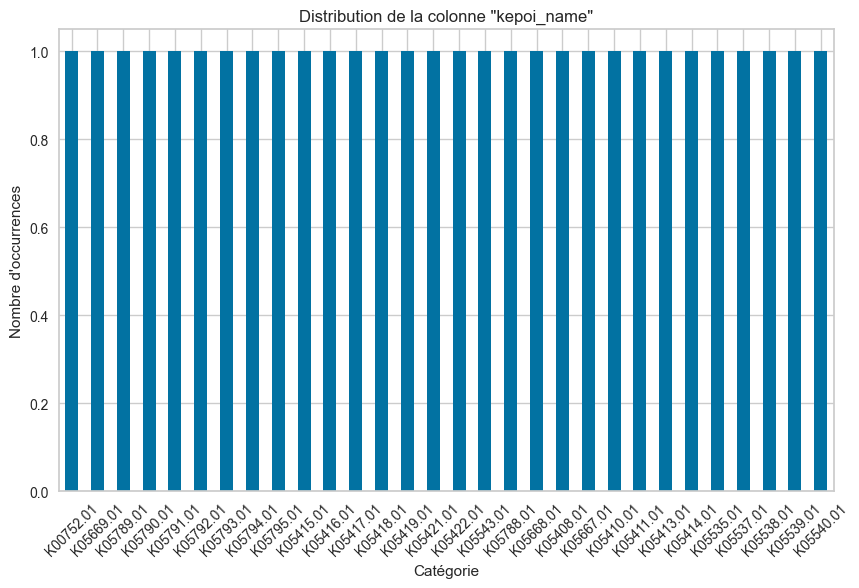

In [25]:
distribution = data['kepoi_name'].value_counts() 
top_categories = distribution.head(30)
plt.figure(figsize=(10, 6))
top_categories.plot(kind='bar')
plt.title('Distribution de la colonne "kepoi_name"')
plt.xlabel('Catégorie')
plt.ylabel('Nombre d\'occurrences')
plt.xticks(rotation=45)  
plt.show()

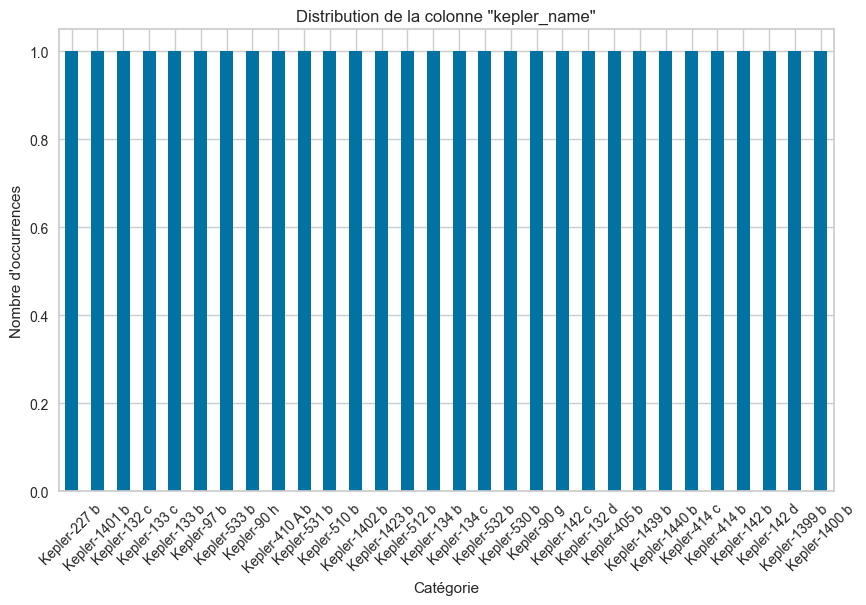

In [26]:
distribution = data['kepler_name'].value_counts() 
top_categories = distribution.head(30)
plt.figure(figsize=(10, 6))
top_categories.plot(kind='bar')
plt.title('Distribution de la colonne "kepler_name"')
plt.xlabel('Catégorie')
plt.ylabel('Nombre d\'occurrences')
plt.xticks(rotation=45)  
plt.show()

In [34]:
fig = px.scatter(data, x="koi_insol", y="koi_teq", template="plotly")
fig.show() 

In [39]:
fig = px.pie(data, values='koi_score', names='koi_disposition')
fig.show() 

In [40]:
fig = px.pie(data, values='koi_score', names='koi_pdisposition')
fig.show()

In [44]:
fig = px.histogram(data, x="koi_disposition", color="koi_disposition")
fig.show()

In [46]:
fig = px.histogram(data, x="koi_pdisposition", template="seaborn")
fig.show()

In [55]:
fig = px.histogram(data, x="koi_fpflag_nt", color="koi_disposition", template="plotly_white")
fig.show()

In [56]:
fig = px.histogram(data, x="koi_fpflag_ss", color="koi_disposition", template="plotly_white")
fig.show()

In [59]:
fig = px.histogram(data, x="koi_fpflag_ec", color="koi_disposition", template="plotly_white")
fig.show()

In [61]:
fig = px.histogram(data, x="koi_impact", color="koi_disposition", template="plotly_white")
fig.show()

In [62]:
fig = px.histogram(data, x="koi_depth", color="koi_disposition", template="plotly_white")
fig.show()

In [63]:
fig = px.histogram(data, x="koi_insol", color="koi_disposition", template="plotly_white")
fig.show()

In [64]:
fig = px.histogram(data, x="koi_steff", color="koi_disposition", template="plotly_white")
fig.show()

In [65]:
fig = px.histogram(data, x="koi_slogg", color="koi_disposition", template="plotly_white")
fig.show()

In [66]:
fig = px.histogram(data, x="koi_srad", color="koi_disposition", template="plotly_white")
fig.show()

In [67]:
fig = px.histogram(data, x="dec", color="koi_disposition", template="plotly_white")
fig.show()

In [51]:
fig = px.histogram(data, x="ra", color="koi_disposition", template="plotly_white")
fig.show()

In [68]:
fig = px.histogram(data, x="koi_kepmag", color="koi_disposition", template="plotly_white")
fig.show()

In [22]:
data.isnull()

,rowid,kepid,kepoi_name,kepler_name,koi_disposition,koi_pdisposition,koi_score,koi_fpflag_nt,koi_fpflag_ss,koi_fpflag_co,...,koi_steff_err2,koi_slogg,koi_slogg_err1,koi_slogg_err2,koi_srad,koi_srad_err1,koi_srad_err2,ra,dec,koi_kepmag
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,False,False,False,True,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,False,False,False,True,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9559,False,False,False,True,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
9560,False,False,False,True,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
9561,False,False,False,True,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
9562,False,False,False,True,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


<Axes: >

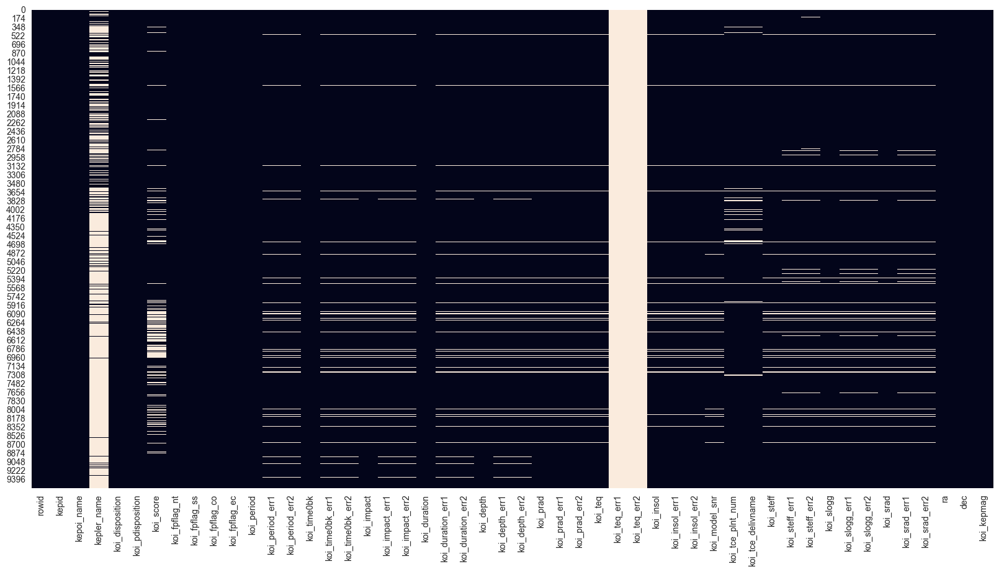

In [23]:
plt.figure(figsize=(20,10))
sns.heatmap(data.isna(), cbar=False)

# Analyse des valeurs manquantes 

L'heatmap ci-dessus nous donne un aperçu visuel des valeurs manquantes dans notre jeu de données. En examinant attentivement le graphique, nous pouvons tirer plusieurs conclusions importantes :

- Nous remarquons que les colonnes **"koi_teq_err1"** et **"koi_teq_err2"** affichent uniquement des valeurs manquantes, ce qui signifie qu'elles ne contiennent aucune valeur valide. Il peut être judicieux de les supprimer de notre analyse étant donné qu'elles ne fourniront aucune information utile.

- La colonne **"kepler_name"** présente un taux de valeurs manquantes particulièrement élevé, ce qui pourrait indiquer un manque de fiabilité ou de pertinence de cette donnée. Avant de prendre une décision sur la façon de gérer ces valeurs manquantes, nous devrons évaluer l'importance de cette variable pour notre analyse.

- Pour les autres colonnes, nous observons un seuil relativement faible de valeurs manquantes. Dans la plupart des cas, il sera possible de gérer ces valeurs manquantes en utilisant des techniques d'imputation ou de suppression, en fonction du contexte de chaque attribut.

En résumé, cette heatmap nous permet d'identifier les colonnes présentant des problèmes de données et nous guide dans le processus de nettoyage et de prétraitement de notre jeu de données avant d'entreprendre une analyse plus approfondie.


In [24]:
nan_columns = data.isnull().sum()
nan_columns = {col:count for col, count in nan_columns.items() if count >0}

In [25]:
pp.pprint(nan_columns)

{  'kepler_name': 7270,
   'koi_depth': 363,
   'koi_depth_err1': 454,
   'koi_depth_err2': 454,
   'koi_duration_err1': 454,
   'koi_duration_err2': 454,
   'koi_impact': 363,
   'koi_impact_err1': 454,
   'koi_impact_err2': 454,
   'koi_insol': 321,
   'koi_insol_err1': 321,
   'koi_insol_err2': 321,
   'koi_kepmag': 1,
   'koi_model_snr': 363,
   'koi_period_err1': 454,
   'koi_period_err2': 454,
   'koi_prad': 363,
   'koi_prad_err1': 363,
   'koi_prad_err2': 363,
   'koi_score': 1510,
   'koi_slogg': 363,
   'koi_slogg_err1': 468,
   'koi_slogg_err2': 468,
   'koi_srad': 363,
   'koi_srad_err1': 468,
   'koi_srad_err2': 468,
   'koi_steff': 363,
   'koi_steff_err1': 468,
   'koi_steff_err2': 483,
   'koi_tce_delivname': 346,
   'koi_tce_plnt_num': 346,
   'koi_teq': 363,
   'koi_teq_err1': 9564,
   'koi_teq_err2': 9564,
   'koi_time0bk_err1': 454,
   'koi_time0bk_err2': 454}


<!-- Analyse des valeurs manquantes dans *koi_teq_err1* et *koi_teq_err2* !-->

En examinant attentivement les données, nous constatons que les colonnes **koi_teq_err1** et **koi_teq_err2** affichent uniquement des valeurs **NaN**. Ces observations indiquent que ces deux colonnes ne contiennent aucune valeur valide et sont donc inutilisables pour notre analyse.

En conséquence, nous prendrons la décision de supprimer ces deux colonnes de notre jeu de données. Cela nous permettra de simplifier notre ensemble de données en éliminant les attributs qui ne contribuent pas à notre analyse et en nous concentrant uniquement sur les données pertinentes et exploitables.

Il est important de noter que la suppression de ces colonnes ne devrait pas compromettre la qualité de notre analyse, car elles ne contiennent aucune information exploitable. Au contraire, cela améliorera la lisibilité et la facilité de manipulation de notre jeu de données, ce qui nous permettra de poursuivre notre analyse de manière plus efficace et cohérente.

In [26]:
data.drop(columns = ["koi_teq_err1", "koi_teq_err2"], inplace = True)

<!-- Analyse des valeurs manquantes dans la colonne Kepler_name -->

Une observation significative se dégage lors de l'analyse de la colonne **Kepler_name**, où un pourcentage élevé de valeurs est identifié comme NaN. Cette constatation suggère que la colonne **Kepler_name** présente un nombre considérable de données manquantes, ce qui rend son utilité limitée pour notre analyse.

En conséquence, nous avons pris la décision de supprimer la colonne **Kepler_name** de notre jeu de données. Cette action nous permettra de réduire la complexité de notre ensemble de données en éliminant un attribut contenant un pourcentage élevé de données manquantes, ce qui rendra notre analyse plus cohérente et plus fiable.

Il est important de noter que cette suppression ne compromettra pas la qualité de notre analyse, car la colonne Kepler_name ne contient pas suffisamment de données exploitables pour contribuer de manière significative à notre étude. En éliminant cette colonne, nous optimisons la qualité et la pertinence de notre ensemble de données pour une analyse plus efficace.


In [27]:
data.drop(columns=["kepler_name"], inplace=True)

<!-- Suppression des lignes contenant un pourcentage élevé de valeurs manquantes -->

Après avoir éliminé les colonnes avec un grand nombre de valeurs **NaN** de notre ensemble de données, nous passons maintenant à la suppression des lignes qui présentent également un pourcentage élevé de valeurs manquantes. Dans cette étape, nous avons fixé un seuil de 20% pour les valeurs **NaN** dans une ligne. Toute ligne dépassant ce seuil sera supprimée de notre ensemble de données.

Cette démarche est essentielle pour garantir la qualité et la fiabilité de notre ensemble de données, en éliminant les observations qui contiennent un nombre important de données manquantes. En supprimant ces lignes, nous réduisons les biais potentiels et assurons la cohérence de notre analyse.

Il est important de noter que la fixation d'un seuil de 20% pour les valeurs **NaN** est une décision arbitraire, mais elle est conforme à des pratiques courantes et permet de maintenir la qualité de notre ensemble de données. Cette étape nous permettra d'obtenir un ensemble de données nettoyé et prêt pour une analyse plus approfondie.


In [28]:
data = data[~(data.isnull().sum(axis=1) > int((0.2)*data.shape[1]))]

<!-- Examen de l'ensemble de données après le nettoyage préliminaire -->

Après avoir effectué le nettoyage préliminaire de notre ensemble de données en supprimant les colonnes et les lignes contenant un grand nombre de valeurs manquantes, nous procédons à un examen de l'ensemble de données nettoyé.

Nous constatons que notre ensemble de données a été considérablement réduit après le nettoyage, ce qui est une indication positive de l'efficacité de nos efforts de nettoyage. En supprimant les colonnes et les lignes contenant des valeurs manquantes, nous avons éliminé les observations qui pourraient introduire des biais dans notre analyse.

Cet examen nous permet de confirmer que notre ensemble de données est maintenant plus cohérent et prêt pour une analyse plus approfondie. Nous pouvons maintenant passer à l'étape suivante de notre processus d'analyse de données en explorant les relations entre les variables et en effectuant des analyses plus avancées.

In [29]:
data.shape

(9110, 47)

Avant :

|            | Valeur |
|------------|--------|
| Lignes  | 9564   |
| Colonnes     | 50     |

Après :

|            | Valeur |
|------------|--------|
| Lignes  | 9110   |
| Colonnes     | 47     |


# Remplacement des valeurs NaN 

Pendant notre phase de nettoyage des données, nous nous sommes concentrés sur le remplacement des valeurs NaN pour assurer l'intégrité de notre ensemble de données. Nous avons identifié deux types de valeurs NaN :

1. **NaN dans les valeurs d'erreur** : Ces valeurs représentent les erreurs *positives* et *négatives* dans l'estimation des attributs.

2. **NaN dans les attributs mesurables** : Ces valeurs manquantes se trouvent dans les attributs mesurables.

Notre approche consiste à remplacer ces valeurs NaN de manière appropriée en utilisant des techniques telles que l'imputation par la moyenne, la médiane ou d'autres méthodes pertinentes, afin de préserver l'intégrité des données et d'éviter les biais dans notre analyse ultérieure.

1. **NaN dans les valeurs d'erreur** : 

In [30]:
data["koi_period_err1"].fillna(np.nanpercentile(data["koi_period_err1"].values, 50), inplace = True) 

C:\Users\DELL Latitude 5330\AppData\Local\Temp\ipykernel_28824\2642374881.py:1: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.





In [31]:
data["koi_period_err2"].fillna(np.nanpercentile(data["koi_period_err2"].values, 50), inplace = True)

C:\Users\DELL Latitude 5330\AppData\Local\Temp\ipykernel_28824\1421649977.py:1: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.





In [32]:
data["koi_time0bk_err1"].fillna(np.nanpercentile(data["koi_time0bk_err1"].values, 50), inplace = True)

C:\Users\DELL Latitude 5330\AppData\Local\Temp\ipykernel_28824\598242385.py:1: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.





In [33]:
data["koi_time0bk_err2"].fillna(np.nanpercentile(data["koi_time0bk_err2"].values, 50), inplace = True)

C:\Users\DELL Latitude 5330\AppData\Local\Temp\ipykernel_28824\1186812291.py:1: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.





In [34]:
data["koi_impact_err1"].fillna(np.nanpercentile(data["koi_impact_err1"].values, 50), inplace = True)

C:\Users\DELL Latitude 5330\AppData\Local\Temp\ipykernel_28824\1302939515.py:1: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.





In [35]:
data["koi_impact_err2"].fillna(np.nanpercentile(data["koi_impact_err2"].values, 50), inplace = True)

C:\Users\DELL Latitude 5330\AppData\Local\Temp\ipykernel_28824\224527198.py:1: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.





In [36]:
data["koi_duration_err1"].fillna(np.nanpercentile(data["koi_duration_err1"].values, 50), inplace = True)

C:\Users\DELL Latitude 5330\AppData\Local\Temp\ipykernel_28824\1030276569.py:1: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.





In [37]:
data["koi_duration_err2"].fillna(np.nanpercentile(data["koi_duration_err2"].values, 50), inplace = True)

C:\Users\DELL Latitude 5330\AppData\Local\Temp\ipykernel_28824\2464576053.py:1: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.





In [38]:
data["koi_depth_err1"].fillna(np.nanpercentile(data["koi_depth_err1"].values, 50), inplace = True)

C:\Users\DELL Latitude 5330\AppData\Local\Temp\ipykernel_28824\1521285156.py:1: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.





In [39]:
data["koi_depth_err2"].fillna(np.nanpercentile(data["koi_depth_err2"].values, 50), inplace = True)

C:\Users\DELL Latitude 5330\AppData\Local\Temp\ipykernel_28824\1014111097.py:1: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.





In [40]:
data["koi_prad_err1"].fillna(np.nanpercentile(data["koi_prad_err1"].values, 50), inplace = True)

C:\Users\DELL Latitude 5330\AppData\Local\Temp\ipykernel_28824\1075116079.py:1: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.





In [41]:
data["koi_prad_err2"].fillna(np.nanpercentile(data["koi_prad_err2"].values, 50), inplace = True)

C:\Users\DELL Latitude 5330\AppData\Local\Temp\ipykernel_28824\3436451567.py:1: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.





In [42]:
data["koi_insol_err1"].fillna(np.nanpercentile(data["koi_insol_err1"].values, 50), inplace = True)

C:\Users\DELL Latitude 5330\AppData\Local\Temp\ipykernel_28824\69668272.py:1: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.





In [43]:
data["koi_steff_err1"].fillna(np.nanpercentile(data["koi_steff_err1"].values, 50), inplace = True)

C:\Users\DELL Latitude 5330\AppData\Local\Temp\ipykernel_28824\2297274346.py:1: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.





In [44]:
data["koi_steff_err2"].fillna(np.nanpercentile(data["koi_steff_err2"].values, 50), inplace = True)

C:\Users\DELL Latitude 5330\AppData\Local\Temp\ipykernel_28824\1664326670.py:1: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.





In [45]:
data["koi_slogg_err1"].fillna(np.nanpercentile(data["koi_slogg_err1"].values, 50), inplace = True)

C:\Users\DELL Latitude 5330\AppData\Local\Temp\ipykernel_28824\1253901888.py:1: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.





In [46]:
data["koi_slogg_err2"].fillna(np.nanpercentile(data["koi_slogg_err2"].values, 50), inplace = True)

C:\Users\DELL Latitude 5330\AppData\Local\Temp\ipykernel_28824\1076866403.py:1: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.





In [47]:
data["koi_srad_err1"].fillna(np.nanpercentile(data["koi_srad_err1"].values, 50), inplace = True)

C:\Users\DELL Latitude 5330\AppData\Local\Temp\ipykernel_28824\1576246192.py:1: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.





In [48]:
data["koi_srad_err2"].fillna(np.nanpercentile(data["koi_srad_err2"].values, 50), inplace = True)

C:\Users\DELL Latitude 5330\AppData\Local\Temp\ipykernel_28824\1983862901.py:1: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.





2. **NaN dans les attributs mesurables**

In [49]:
data["koi_depth"].fillna(np.nanpercentile(data["koi_depth"].values, 50), inplace = True)

C:\Users\DELL Latitude 5330\AppData\Local\Temp\ipykernel_28824\449787422.py:1: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.





In [50]:
data["koi_impact"].fillna(np.nanpercentile(data["koi_impact"].values, 50), inplace = True)

C:\Users\DELL Latitude 5330\AppData\Local\Temp\ipykernel_28824\1865984003.py:1: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.





In [51]:
data["koi_insol"].fillna(np.nanpercentile(data["koi_insol"].values, 50), inplace = True)

C:\Users\DELL Latitude 5330\AppData\Local\Temp\ipykernel_28824\2575618669.py:1: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.





In [52]:
data["koi_kepmag"].fillna(np.nanpercentile(data["koi_kepmag"].values, 50), inplace = True)

C:\Users\DELL Latitude 5330\AppData\Local\Temp\ipykernel_28824\203921612.py:1: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.





In [53]:
data["koi_model_snr"].fillna(np.nanpercentile(data["koi_model_snr"].values, 50), inplace = True)

C:\Users\DELL Latitude 5330\AppData\Local\Temp\ipykernel_28824\908239174.py:1: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.





In [54]:
data["koi_prad"].fillna(np.nanpercentile(data["koi_prad"].values, 50), inplace = True)

C:\Users\DELL Latitude 5330\AppData\Local\Temp\ipykernel_28824\1355883178.py:1: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.





In [55]:
data["koi_score"].fillna(np.nanpercentile(data["koi_score"].values, 50), inplace = True)

C:\Users\DELL Latitude 5330\AppData\Local\Temp\ipykernel_28824\1918397009.py:1: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.





In [56]:
data["koi_slogg"].fillna(np.nanpercentile(data["koi_slogg"].values, 50), inplace = True)

C:\Users\DELL Latitude 5330\AppData\Local\Temp\ipykernel_28824\658361040.py:1: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.





In [57]:
data["koi_srad"].fillna(np.nanpercentile(data["koi_srad"].values, 50), inplace = True)

C:\Users\DELL Latitude 5330\AppData\Local\Temp\ipykernel_28824\3892242834.py:1: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.





In [58]:
data["koi_steff"].fillna(np.nanpercentile(data["koi_steff"].values, 50), inplace = True)

C:\Users\DELL Latitude 5330\AppData\Local\Temp\ipykernel_28824\1620266178.py:1: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.





In [59]:
data["koi_teq"].fillna(np.nanpercentile(data["koi_teq"].values, 50), inplace = True)

C:\Users\DELL Latitude 5330\AppData\Local\Temp\ipykernel_28824\3634449991.py:1: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.





<Axes: >

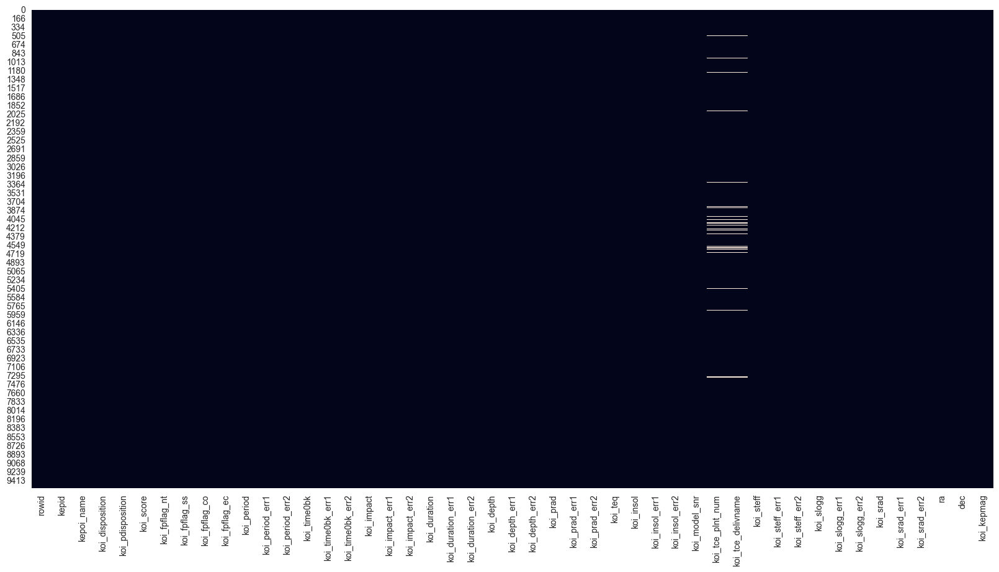

In [60]:
plt.figure(figsize=(20,10))
sns.heatmap(data.isna(), cbar=False) 

Après avoir remplacé les valeurs manquantes dans notre ensemble de données, nous avons effectué une vérification supplémentaire en visualisant à nouveau notre ensemble de données à l'aide d'une **heatmap**. Cette représentation graphique nous permet de visualiser la distribution des valeurs manquantes dans notre ensemble de données.

Nous sommes heureux de constater qu'à ce stade, la **heatmap** ne montre aucune valeur manquante. Cette observation est encourageante car elle indique que notre processus de nettoyage des données a été efficace pour traiter les valeurs manquantes, ce qui renforce la qualité de notre ensemble de données pour une analyse ultérieure.


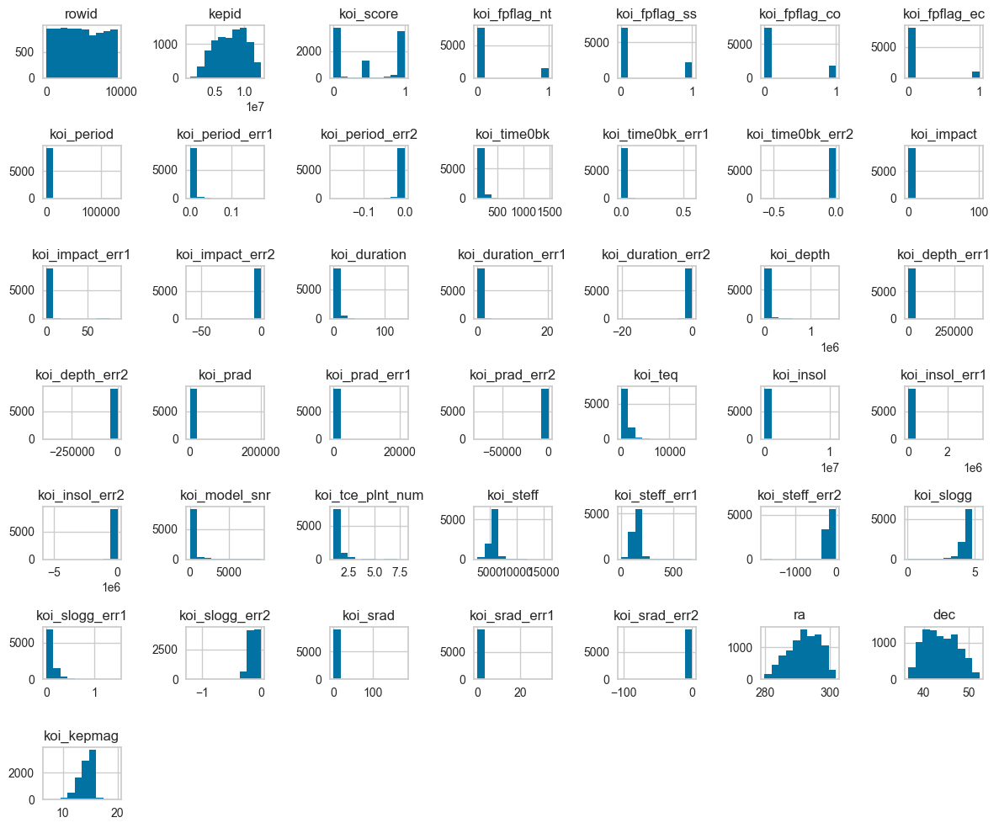

In [61]:
data.hist(figsize=(12, 10))
plt.tight_layout()
plt.show() 

In [62]:
print("\nStatistiques descriptives après l'imputation :")
data.describe()


Statistiques descriptives après l'imputation :


,rowid,kepid,koi_score,koi_fpflag_nt,koi_fpflag_ss,koi_fpflag_co,koi_fpflag_ec,koi_period,koi_period_err1,koi_period_err2,...,koi_steff_err2,koi_slogg,koi_slogg_err1,koi_slogg_err2,koi_srad,koi_srad_err1,koi_srad_err2,ra,dec,koi_kepmag
count,9110.000000,9.110000e+03,9110.000000,9110.000000,9110.000000,9110.000000,9110.000000,9110.000000,9110.000000,9110.000000,...,9110.000000,9110.000000,9110.000000,9110.000000,9110.000000,9110.000000,9110.000000,9110.000000,9110.000000,9110.000000
mean,4709.512733,7.692594e+06,0.477030,0.168057,0.238968,0.198683,0.122613,74.583698,0.002148,-0.002148,...,-162.027991,4.311941,0.119746,-0.143041,1.691339,0.357058,-0.375120,292.053748,43.813494,14.282147
std,2773.850461,2.654316e+06,0.445258,0.373937,0.426477,0.399031,0.328010,1367.274804,0.008236,0.008236,...,72.245398,0.427907,0.131761,0.085158,5.591121,0.898901,1.782161,4.759769,3.601890,1.375860
min,1.000000,7.574500e+05,0.000000,0.000000,0.000000,0.000000,0.000000,0.241843,0.000000,-0.172500,...,-1762.000000,0.047000,0.000000,-1.207000,0.109000,0.000000,-103.825000,279.852720,36.577381,6.966000
25%,2313.250000,5.563063e+06,0.000000,0.000000,0.000000,0.000000,0.000000,2.696747,0.000005,-0.000276,...,-197.000000,4.220000,0.044000,-0.196000,0.829000,0.131000,-0.242750,288.669353,40.789816,13.469250
50%,4622.500000,7.918822e+06,0.408000,0.000000,0.000000,0.000000,0.000000,9.338019,0.000035,-0.000035,...,-160.000000,4.438000,0.070000,-0.128000,1.000000,0.250000,-0.111000,292.253740,43.696252,14.539000
75%,7135.750000,9.872696e+06,0.996000,0.000000,0.000000,0.000000,0.000000,37.106545,0.000276,-0.000005,...,-115.000000,4.543000,0.147000,-0.090000,1.339000,0.361000,-0.069000,295.857110,46.713491,15.329000
max,9564.000000,1.293514e+07,1.000000,1.000000,1.000000,1.000000,1.000000,129995.778400,0.172500,0.000000,...,0.000000,5.364000,1.472000,0.000000,180.013000,33.091000,0.000000,301.720760,52.336010,20.003000


# 2eme Partie :
---

### Exploration approfondie de l'ensemble de données

Dans cette deuxième partie de notre analyse, nous allons nous plonger dans une exploration plus approfondie de notre ensemble de données. Cette phase est cruciale car elle nous permettra de mieux comprendre la nature de nos données, d'identifier des tendances intéressantes, et de découvrir des insights qui pourraient orienter nos analyses futures.

#### Objectifs :
1. Examiner les distributions des variables principales.
2. Identifier les corrélations entre les variables.
3. Rechercher des tendances ou des schémas significatifs dans les données.
4. Identifier les variables les plus importantes pour notre objectif d'analyse.

Nous utiliserons une variété de techniques d'exploration de données, y compris des visualisations graphiques telles que des histogrammes, des nuages de points, des corrélations, ainsi que des analyses statistiques pour obtenir un aperçu approfondi de notre ensemble de données.

In [63]:
print(data.shape)

(9110, 47)



|            | Valeur |
|------------|--------|
| Lignes  | 9110   |
| Colonnes     | 47     |

In [64]:
data.head()

,rowid,kepid,kepoi_name,koi_disposition,koi_pdisposition,koi_score,koi_fpflag_nt,koi_fpflag_ss,koi_fpflag_co,koi_fpflag_ec,...,koi_steff_err2,koi_slogg,koi_slogg_err1,koi_slogg_err2,koi_srad,koi_srad_err1,koi_srad_err2,ra,dec,koi_kepmag
0,1,10797460,K00752.01,CONFIRMED,CANDIDATE,1.000,0,0,0,0,...,-81.0,4.467,0.064,-0.096,0.927,0.105,-0.061,291.93423,48.141651,15.347
1,2,10797460,K00752.02,CONFIRMED,CANDIDATE,0.969,0,0,0,0,...,-81.0,4.467,0.064,-0.096,0.927,0.105,-0.061,291.93423,48.141651,15.347
2,3,10811496,K00753.01,FALSE POSITIVE,FALSE POSITIVE,0.000,0,1,0,0,...,-176.0,4.544,0.044,-0.176,0.868,0.233,-0.078,297.00482,48.134129,15.436
3,4,10848459,K00754.01,FALSE POSITIVE,FALSE POSITIVE,0.000,0,1,0,0,...,-174.0,4.564,0.053,-0.168,0.791,0.201,-0.067,285.53461,48.285210,15.597
4,5,10854555,K00755.01,CONFIRMED,CANDIDATE,1.000,0,0,0,0,...,-211.0,4.438,0.070,-0.210,1.046,0.334,-0.133,288.75488,48.226200,15.509


In [65]:
data.tail()

,rowid,kepid,kepoi_name,koi_disposition,koi_pdisposition,koi_score,koi_fpflag_nt,koi_fpflag_ss,koi_fpflag_co,koi_fpflag_ec,...,koi_steff_err2,koi_slogg,koi_slogg_err1,koi_slogg_err2,koi_srad,koi_srad_err1,koi_srad_err2,ra,dec,koi_kepmag
9559,9560,10031643,K07984.01,FALSE POSITIVE,FALSE POSITIVE,0.000,0,0,0,1,...,-152.0,4.296,0.231,-0.189,1.088,0.313,-0.228,298.74921,46.973351,14.478
9560,9561,10090151,K07985.01,FALSE POSITIVE,FALSE POSITIVE,0.000,0,1,1,0,...,-166.0,4.529,0.035,-0.196,0.903,0.237,-0.079,297.18875,47.093819,14.082
9561,9562,10128825,K07986.01,CANDIDATE,CANDIDATE,0.497,0,0,0,0,...,-220.0,4.444,0.056,-0.224,1.031,0.341,-0.114,286.50937,47.163219,14.757
9562,9563,10147276,K07987.01,FALSE POSITIVE,FALSE POSITIVE,0.021,0,0,1,0,...,-236.0,4.447,0.056,-0.224,1.041,0.341,-0.114,294.16489,47.176281,15.385
9563,9564,10156110,K07989.01,FALSE POSITIVE,FALSE POSITIVE,0.000,0,0,1,1,...,-225.0,4.385,0.054,-0.216,1.193,0.410,-0.137,297.00977,47.121021,14.826


In [66]:
data.describe()

,rowid,kepid,koi_score,koi_fpflag_nt,koi_fpflag_ss,koi_fpflag_co,koi_fpflag_ec,koi_period,koi_period_err1,koi_period_err2,...,koi_steff_err2,koi_slogg,koi_slogg_err1,koi_slogg_err2,koi_srad,koi_srad_err1,koi_srad_err2,ra,dec,koi_kepmag
count,9110.000000,9.110000e+03,9110.000000,9110.000000,9110.000000,9110.000000,9110.000000,9110.000000,9110.000000,9110.000000,...,9110.000000,9110.000000,9110.000000,9110.000000,9110.000000,9110.000000,9110.000000,9110.000000,9110.000000,9110.000000
mean,4709.512733,7.692594e+06,0.477030,0.168057,0.238968,0.198683,0.122613,74.583698,0.002148,-0.002148,...,-162.027991,4.311941,0.119746,-0.143041,1.691339,0.357058,-0.375120,292.053748,43.813494,14.282147
std,2773.850461,2.654316e+06,0.445258,0.373937,0.426477,0.399031,0.328010,1367.274804,0.008236,0.008236,...,72.245398,0.427907,0.131761,0.085158,5.591121,0.898901,1.782161,4.759769,3.601890,1.375860
min,1.000000,7.574500e+05,0.000000,0.000000,0.000000,0.000000,0.000000,0.241843,0.000000,-0.172500,...,-1762.000000,0.047000,0.000000,-1.207000,0.109000,0.000000,-103.825000,279.852720,36.577381,6.966000
25%,2313.250000,5.563063e+06,0.000000,0.000000,0.000000,0.000000,0.000000,2.696747,0.000005,-0.000276,...,-197.000000,4.220000,0.044000,-0.196000,0.829000,0.131000,-0.242750,288.669353,40.789816,13.469250
50%,4622.500000,7.918822e+06,0.408000,0.000000,0.000000,0.000000,0.000000,9.338019,0.000035,-0.000035,...,-160.000000,4.438000,0.070000,-0.128000,1.000000,0.250000,-0.111000,292.253740,43.696252,14.539000
75%,7135.750000,9.872696e+06,0.996000,0.000000,0.000000,0.000000,0.000000,37.106545,0.000276,-0.000005,...,-115.000000,4.543000,0.147000,-0.090000,1.339000,0.361000,-0.069000,295.857110,46.713491,15.329000
max,9564.000000,1.293514e+07,1.000000,1.000000,1.000000,1.000000,1.000000,129995.778400,0.172500,0.000000,...,0.000000,5.364000,1.472000,0.000000,180.013000,33.091000,0.000000,301.720760,52.336010,20.003000


In [67]:
columns=data.columns 
erreur_columns=[col for col in columns if "err" in col] 
exclu_columns=["rowid", "kepid", "kepoi_name","koi_score","koi_disposition","koi_pdisposition", "koi_tce_delivname", "koi_tce_plnt_num"] + erreur_columns 
columns_utile=list(set(columns)-set(exclu_columns))

In [68]:
print("le nombre de colonnes a utilisé est : " , len(columns_utile))

le nombre de colonnes a utilisé est :  19


In [69]:
data[columns_utile].head()

,koi_impact,koi_model_snr,koi_depth,dec,koi_teq,koi_slogg,koi_srad,ra,koi_insol,koi_fpflag_co,koi_fpflag_nt,koi_kepmag,koi_duration,koi_time0bk,koi_period,koi_steff,koi_fpflag_ec,koi_fpflag_ss,koi_prad
0,0.146,35.8,615.8,48.141651,793.0,4.467,0.927,291.93423,93.59,0,0,15.347,2.95750,170.538750,9.488036,5455.0,0,0,2.26
1,0.586,25.8,874.8,48.141651,443.0,4.467,0.927,291.93423,9.11,0,0,15.347,4.50700,162.513840,54.418383,5455.0,0,0,2.83
2,0.969,76.3,10829.0,48.134129,638.0,4.544,0.868,297.00482,39.30,0,0,15.436,1.78220,175.850252,19.899140,5853.0,0,1,14.60
3,1.276,505.6,8079.2,48.285210,1395.0,4.564,0.791,285.53461,891.96,0,0,15.597,2.40641,170.307565,1.736952,5805.0,0,1,33.46
4,0.701,40.9,603.3,48.226200,1406.0,4.438,1.046,288.75488,926.16,0,0,15.509,1.65450,171.595550,2.525592,6031.0,0,0,2.75


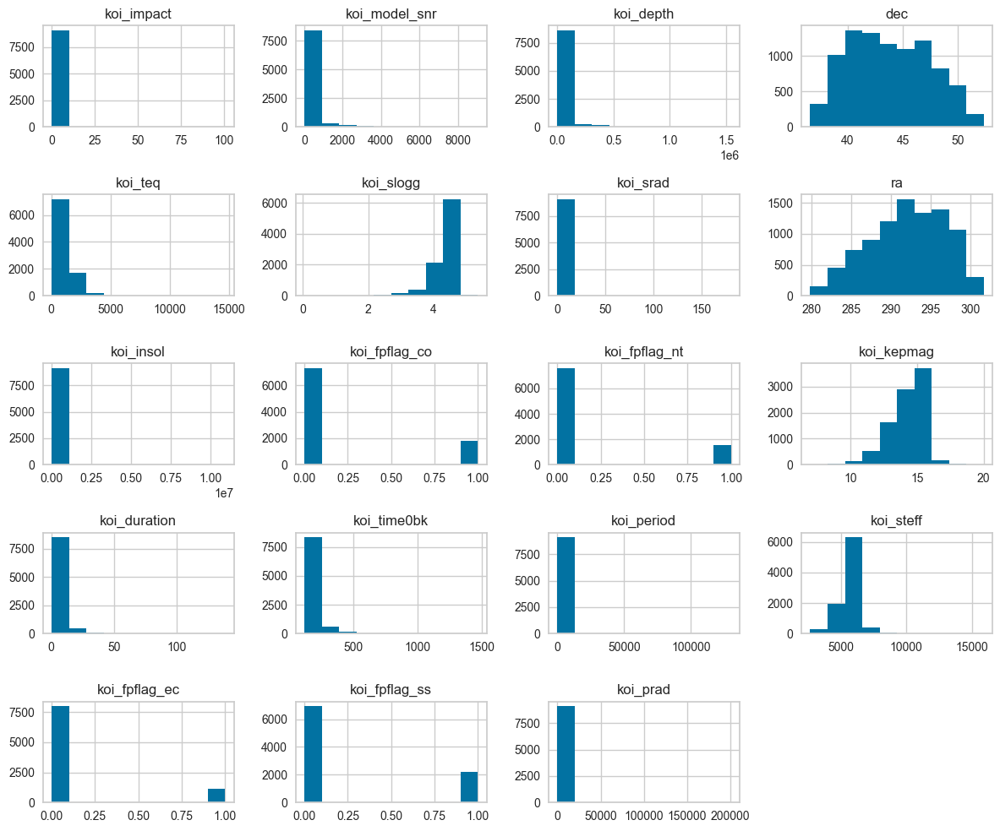

In [70]:
data[columns_utile].hist(figsize=(12, 10))
plt.tight_layout()
plt.show() 

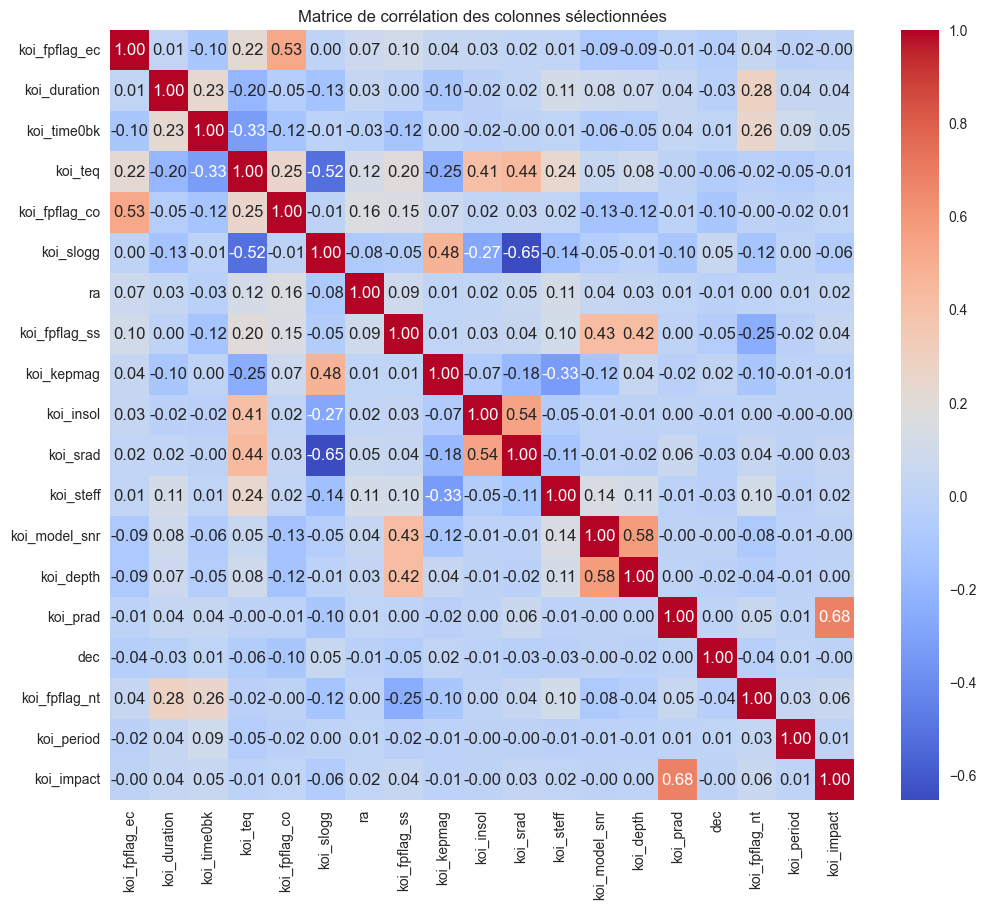

In [71]:
selected_columns = ['koi_fpflag_ec', 'koi_duration', 'koi_time0bk', 'koi_teq', 'koi_fpflag_co',
                    'koi_slogg', 'ra', 'koi_fpflag_ss', 'koi_kepmag', 'koi_insol', 'koi_srad',
                    'koi_steff', 'koi_model_snr', 'koi_depth', 'koi_prad', 'dec', 'koi_fpflag_nt',
                    'koi_period', 'koi_impact']

correlation_matrix = data[selected_columns].corr()
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Matrice de corrélation des colonnes sélectionnées')
plt.show()


**Traitement** de la variabe **cible** 

In [72]:
target_variable = "koi_disposition"

In [73]:
fig = px.histogram(data, x="koi_disposition", template="seaborn")
fig.show()

In [74]:
np.unique(data[target_variable].values)

array(['CANDIDATE', 'CONFIRMED', 'FALSE POSITIVE'], dtype=object)

In [75]:
class_counts = data['koi_disposition'].value_counts()
class_counts

koi_disposition
FALSE POSITIVE    4647
CONFIRMED         2292
CANDIDATE         2171
Name: count, dtype: int64

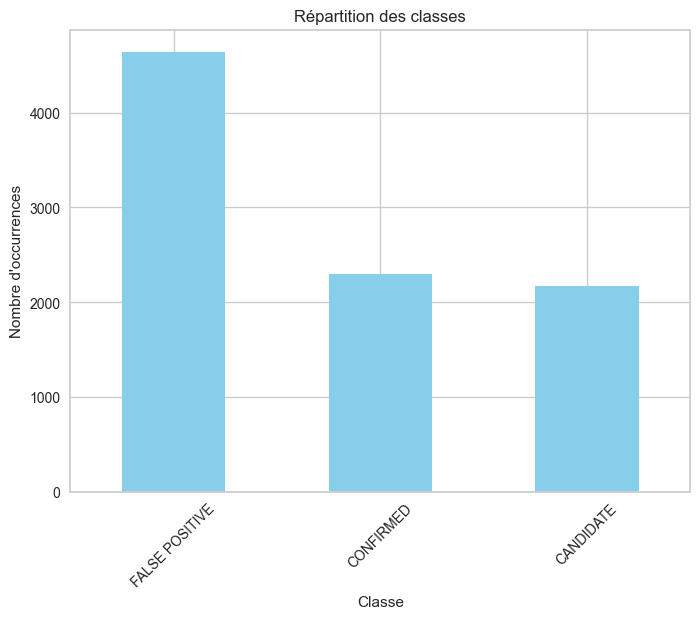

In [76]:
plt.figure(figsize=(8, 6))
class_counts.plot(kind='bar', color='skyblue')
plt.title('Répartition des classes')
plt.xlabel('Classe')
plt.ylabel('Nombre d\'occurrences')
plt.xticks(rotation=45)
plt.show()

In [77]:
total_samples = len(data)
class_proportions = class_counts / total_samples
print("Proportions des classes :")
print(class_proportions)

Proportions des classes :
koi_disposition
FALSE POSITIVE    0.510099
CONFIRMED         0.251592
CANDIDATE         0.238310
Name: count, dtype: float64


Nous extrayons uniquement les lignes qui sont soit des exemples **positifs** soit des exemples **négatifs**, c'est-à-dire lorsque la valeur de `disposition` n'est *pas* `CANDIDATE`. En effet, `CANDIDATE` est la **valeur par défaut** pour tous les objets d'intérêt détectés par Kepler. Les étiquettes `CONFIRMÉ`et `FALSE POSITIVE` servent de nos étiquettes **positives** et **négatives**.

In [78]:
data = data[data["koi_disposition"] != "CANDIDATE"]
print(data.shape)
data.head() 

(6939, 47)


,rowid,kepid,kepoi_name,koi_disposition,koi_pdisposition,koi_score,koi_fpflag_nt,koi_fpflag_ss,koi_fpflag_co,koi_fpflag_ec,...,koi_steff_err2,koi_slogg,koi_slogg_err1,koi_slogg_err2,koi_srad,koi_srad_err1,koi_srad_err2,ra,dec,koi_kepmag
0,1,10797460,K00752.01,CONFIRMED,CANDIDATE,1.000,0,0,0,0,...,-81.0,4.467,0.064,-0.096,0.927,0.105,-0.061,291.93423,48.141651,15.347
1,2,10797460,K00752.02,CONFIRMED,CANDIDATE,0.969,0,0,0,0,...,-81.0,4.467,0.064,-0.096,0.927,0.105,-0.061,291.93423,48.141651,15.347
2,3,10811496,K00753.01,FALSE POSITIVE,FALSE POSITIVE,0.000,0,1,0,0,...,-176.0,4.544,0.044,-0.176,0.868,0.233,-0.078,297.00482,48.134129,15.436
3,4,10848459,K00754.01,FALSE POSITIVE,FALSE POSITIVE,0.000,0,1,0,0,...,-174.0,4.564,0.053,-0.168,0.791,0.201,-0.067,285.53461,48.285210,15.597
4,5,10854555,K00755.01,CONFIRMED,CANDIDATE,1.000,0,0,0,0,...,-211.0,4.438,0.070,-0.210,1.046,0.334,-0.133,288.75488,48.226200,15.509


In [79]:
class_counts = data['koi_disposition'].value_counts()

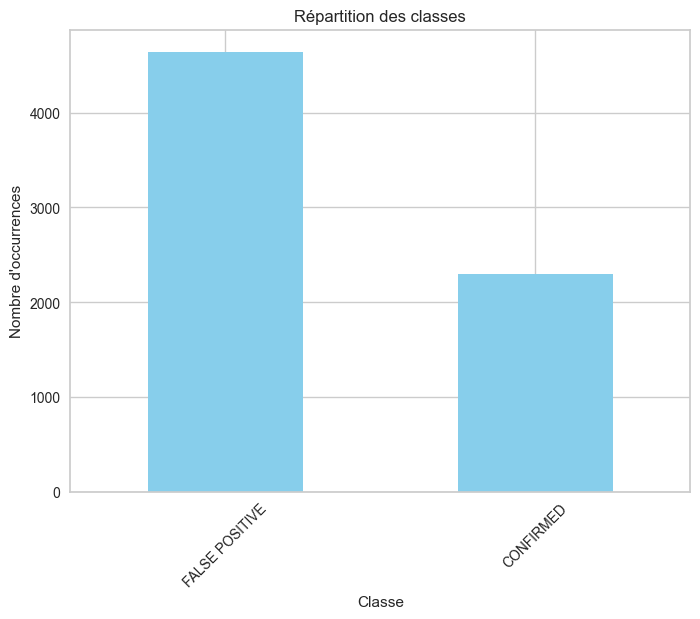

In [80]:
plt.figure(figsize=(8, 6))
class_counts.plot(kind='bar', color='skyblue')
plt.title('Répartition des classes')
plt.xlabel('Classe')
plt.ylabel('Nombre d\'occurrences')
plt.xticks(rotation=45)
plt.show()

Transformant le type de variable cible de **object** a **int** pour faciliter le traitement

In [81]:
data["koi_disposition"] = data["koi_disposition"].apply(lambda x: x == 'CONFIRMED').astype(int)

In [82]:
class_counts = data['koi_disposition'].value_counts()

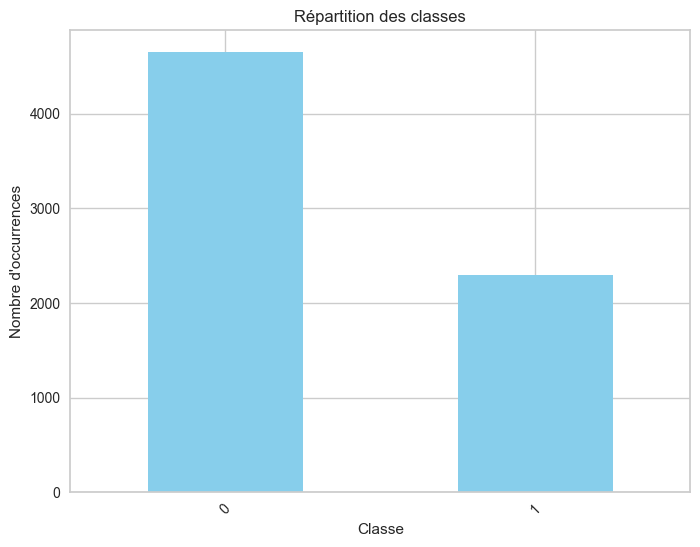

In [83]:
plt.figure(figsize=(8, 6))
class_counts.plot(kind='bar', color='skyblue')
plt.title('Répartition des classes')
plt.xlabel('Classe')
plt.ylabel('Nombre d\'occurrences')
plt.xticks(rotation=45)
plt.show()

In [84]:
data.head()

,rowid,kepid,kepoi_name,koi_disposition,koi_pdisposition,koi_score,koi_fpflag_nt,koi_fpflag_ss,koi_fpflag_co,koi_fpflag_ec,...,koi_steff_err2,koi_slogg,koi_slogg_err1,koi_slogg_err2,koi_srad,koi_srad_err1,koi_srad_err2,ra,dec,koi_kepmag
0,1,10797460,K00752.01,1,CANDIDATE,1.000,0,0,0,0,...,-81.0,4.467,0.064,-0.096,0.927,0.105,-0.061,291.93423,48.141651,15.347
1,2,10797460,K00752.02,1,CANDIDATE,0.969,0,0,0,0,...,-81.0,4.467,0.064,-0.096,0.927,0.105,-0.061,291.93423,48.141651,15.347
2,3,10811496,K00753.01,0,FALSE POSITIVE,0.000,0,1,0,0,...,-176.0,4.544,0.044,-0.176,0.868,0.233,-0.078,297.00482,48.134129,15.436
3,4,10848459,K00754.01,0,FALSE POSITIVE,0.000,0,1,0,0,...,-174.0,4.564,0.053,-0.168,0.791,0.201,-0.067,285.53461,48.285210,15.597
4,5,10854555,K00755.01,1,CANDIDATE,1.000,0,0,0,0,...,-211.0,4.438,0.070,-0.210,1.046,0.334,-0.133,288.75488,48.226200,15.509


Division de dataset pour avoir la variable **dependante** et **independante** alors  **X** et **Y**

In [85]:
X = data[columns_utile].values
Y = data["koi_disposition"]

In [86]:
from imblearn.combine import SMOTETomek
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

In [87]:
X = StandardScaler().fit_transform(X)

In [88]:
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.33, random_state=0, stratify=Y)

In [89]:
scaler = StandardScaler()

In [90]:
X_train_scaled = scaler.fit_transform(X_train) 

In [91]:
X_test_scaled = scaler.transform(X_test)

In [92]:
smote_tomek = SMOTETomek(random_state=42)
X_resampled_train, y_resampled_train = smote_tomek.fit_resample(X_train_scaled, y_train)

In [93]:
import pandas as pd
import matplotlib.pyplot as plt

In [94]:
class_counts_resampled = pd.Series(y_resampled_train).value_counts()

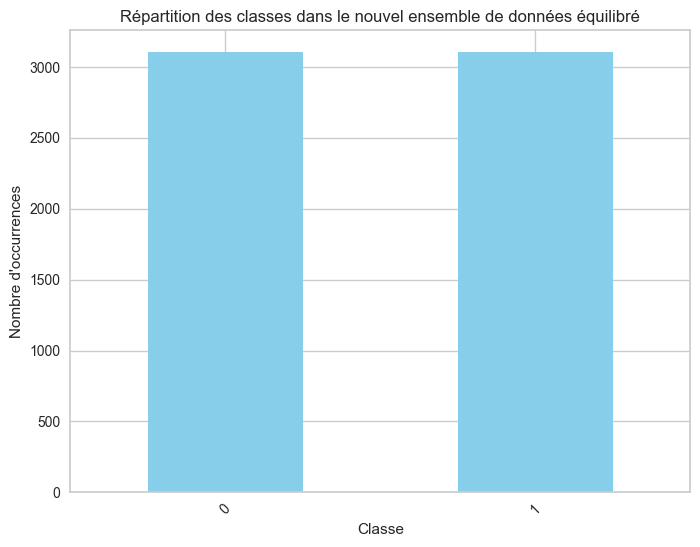

In [95]:
plt.figure(figsize=(8, 6))
class_counts_resampled.plot(kind='bar', color='skyblue')
plt.title('Répartition des classes dans le nouvel ensemble de données équilibré')
plt.xlabel('Classe')
plt.ylabel('Nombre d\'occurrences')
plt.xticks(rotation=45)
plt.show()

In [100]:
X_train = X_resampled_train
y_train = y_resampled_train

# 3eme Partie :
---

## Concepts d'évaluation des Modèles

Avant de débuter l'application des modèles, il est essentiel de se familiariser avec les concepts d'évaluation des performances. Cette démarche nous permettra d'apprécier adéquatement les résultats obtenus par nos modèles d'apprentissage automatique. 

Il existe plusieurs méthodes pour évaluer les résultats des modèles d'apprentissage automatique. Voici quelques-unes des méthodes les plus couramment utilisées :

1. **Validation croisée (Cross-validation)** : Divise le jeu de données en plusieurs sous-ensembles pour évaluer les performances du modèle sur des données différentes de celles utilisées pour l'apprentissage.

2. **Matrice de confusion (Confusion Matrix)** : Fournit un résumé des performances du modèle en comparant les prédictions aux valeurs réelles. Elle est utile pour évaluer la précision, le rappel, la spécificité et d'autres mesures de performance.

3. **Courbes ROC et AUC (Receiver Operating Characteristic Curve and Area Under the Curve)** : Utilisées pour évaluer les performances des modèles de classification binaire en mesurant la capacité du modèle à discriminer entre les classes.

4. **Métriques de performance** : Comprend des mesures telles que l'exactitude (accuracy), le rappel (recall), la précision (precision), le F1-score, l'aire sous la courbe ROC (AUC), etc.

5. **Analyses de sensibilité et de spécificité** : Utiles pour évaluer la capacité du modèle à classer correctement les exemples positifs et négatifs.


#  score de validation croisée

In [96]:
def crossValidationCheck(classifier, X, y, K=10):
    cv = KFold(n_splits=K, random_state=1, shuffle=True)
    scores = cross_val_score(classifier, X, y, scoring='f1', cv=cv, n_jobs=-1)
    print(f"Average F1 score over {K}-Folds: {scores.mean()}")
    visualizer = CVScores(classifier, cv=cv, scoring='f1')
    visualizer.fit(X, y)
    visualizer = LearningCurve(classifier, cv=cv, scoring='f1', n_jobs=-1)
    visualizer.fit(X, y)
    cv = StratifiedKFold(n_splits=K, random_state=1, shuffle=True)
    scores = cross_val_score(classifier, X, y, scoring='f1', cv=cv, n_jobs=-1)
    print(f"Average F1 score over Stratified {K}-Folds: {scores.mean()}")
    visualizer = CVScores(classifier, cv=cv, scoring='f1')
    visualizer.fit(X, y)
    visualizer = LearningCurve(classifier, cv=cv, scoring='f1', n_jobs=-1)
    visualizer.fit(X, y) 

# Perfermances metriques: 

In [97]:
def metriques_perfermance(test, pred):
    conf_matrix = confusion_matrix(test, pred)
    f1 = f1_score(test, pred)
    report = classification_report(test, pred)
    accuracy = balanced_accuracy_score(test, pred)
    kappa = cohen_kappa_score(test, pred)
    print(f"F1 Score: {f1}")
    print(f"Kappa Score: {kappa}")
    print(f"Accuracy Score: {accuracy}")
    print(f"Confusion Matrix:\n{conf_matrix}")
    print(report)

# ROC-AUC : 

In [98]:
def calculate_roc_auc(model, X_test, y_test):
    y_prob = model.predict_proba(X_test)[:, 1]
    auc = roc_auc_score(y_test, y_prob)
    return auc

# Matrice de confusion : 

In [99]:
def Matrix(model,test,pred): 
    cm = confusion_matrix(test, pred)
    plt.figure(figsize=(8,6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='coolwarm', cbar=False)
    plt.xlabel('Prédictions')
    plt.ylabel('Vraies étiquettes')
    plt.title('Matrice de confusion')
    plt.show()

## 1er Modele SVM :

### Machines à Vecteurs de Support (SVM) pour la Dataset Kepler

Les Machines à Vecteurs de Support (SVM) sont un outil puissant d'apprentissage supervisé qui peut être utilisé pour classer les objets d'intérêt identifiés par le télescope Kepler. L'objectif principal des SVM dans le contexte de la dataset Kepler est de trouver un hyperplan dans un espace multidimensionnel qui sépare de manière optimale les différents types de planètes confirmées et les faux positifs. En utilisant les caractéristiques observées des exoplanètes, telles que leur période orbitale, leur taille et d'autres attributs, les SVM peuvent apprendre à distinguer entre les planètes confirmées et les faux positifs avec une précision élevée. Grâce à leur capacité à gérer des données complexes et non linéaires, les SVM peuvent être particulièrement utiles pour analyser et classifier les données issues de la mission Kepler.

In [696]:
#sns.pairplot(data,hue='koi_disposition',palette='Dark2') 

In [101]:
classifier = SVC(kernel='rbf', random_state=0) 

In [102]:
classifier.fit(X_train, y_train)

SVC(random_state=0)

In [103]:
y_pred = classifier.predict(X_test)

In [104]:
error_rate = 1.0 - classifier.score(X_resampled_train, y_resampled_train)
print("Taux d'erreur sur l'ensemble d'entraînement:", error_rate)

Taux d'erreur sur l'ensemble d'entraînement: 0.011601675797615174


**-** Avec une erreur de seulement **0.014267185473411104**, cela signifie que le modèle a correctement classé la grande majorité des exemples dans l'ensemble d'entraînement. Cette précision élevée est un indicateur positif de la qualité du modèle.

In [105]:
metriques_perfermance(y_test,y_pred)

F1 Score: 0.9794293297942933
Kappa Score: 0.96934163327601
Accuracy Score: 0.9838579499596449
Confusion Matrix:
[[1521   13]
 [  18  738]]
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      1534
           1       0.98      0.98      0.98       756

    accuracy                           0.99      2290
   macro avg       0.99      0.98      0.98      2290
weighted avg       0.99      0.99      0.99      2290



Ces résultats indiquent que le modèle a bien appris à distinguer entre les deux classes de manière précise et cohérente. Il semble être robuste et performant, ce qui suggère qu'il pourrait être utilisé avec confiance dans des applications réelles.

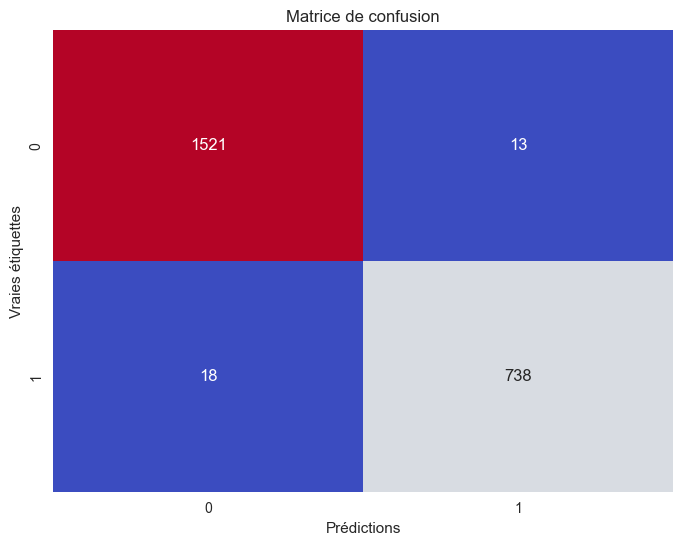

In [106]:
Matrix(classifier,y_test,y_pred)

# Vérification du score de validation croisée 

Average F1 score over 10-Folds: 0.987098285685726
Average F1 score over Stratified 10-Folds: 0.9872370951776871


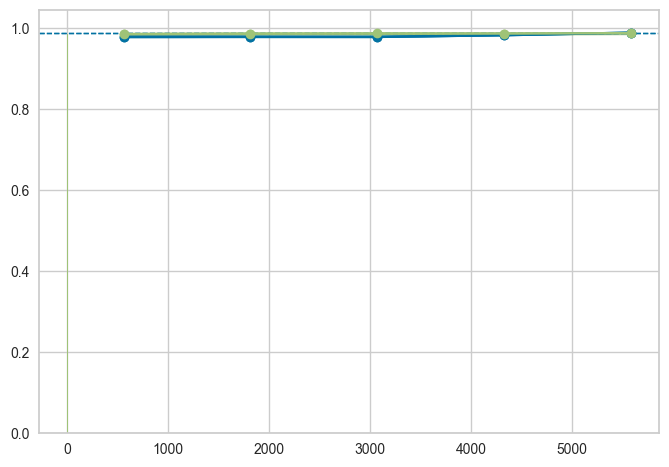

In [107]:
crossValidationCheck(classifier, X_train,y_train, K=10) 

1. **Average F1 score over 10-Folds :** Cette mesure représente la moyenne des F1 scores obtenus lors de la validation croisée à 10 plis. Un F1 score moyen de 0.9766139372147696 sur 10 plis indique une bonne capacité du modèle à maintenir une performance élevée de manière cohérente sur des ensembles de données différents, ce qui suggère une robustesse de la généralisation.

2. **Average F1 score over Stratified 10-Folds :** Lorsqu'on utilise la validation croisée stratifiée à 10 plis, qui maintient la distribution des classes dans chaque pli similaire à celle de l'ensemble de données complet, le F1 score moyen est légèrement plus élevé avec une valeur de 0.977206096029063. Cela suggère que la stratification des plis pourrait aider à améliorer légèrement la performance du modèle en s'assurant qu'il est entraîné et évalué de manière équilibrée sur les classes.

ces scores moyens montrent que le modèle maintient une performance élevée et stable à travers différentes méthodes de validation croisée, ce qui renforce la confiance dans sa capacité à généraliser efficacement sur de nouveaux ensembles de données.

## Optimisation des hyperparamètres pour SVM

 Bien que les performances actuelles du modèle soient solides, des opportunités d'amélioration subsistent. Une optimisation continue, notamment par l'ajustement des hyperparamètres et l'exploration de nouvelles fonctionnalités, pourrait permettre d'accroître encore davantage son efficacité et sa robustesse.

In [108]:
parameters = {
    "C":np.arange(1, 3.05, 0.05),
    "gamma":["scale", "auto"],
    "shrinking":[True, False],
    "tol":[1e-3, 1e-2, 1e-1, 1, 1e1, 1e2, 1e3],
    "class_weight":[None, "balanced"]
}
scores = ["f1", "balanced_accuracy"]

 Utilisation de la méthode de **recherche par grille** pour trouver la meilleure combinaison de paramètres.

In [109]:
from sklearn.model_selection import GridSearchCV
classifier = GridSearchCV(
    SVC(kernel="rbf", random_state=0),
    param_grid=parameters,
    scoring=scores,
    refit="f1",
    verbose=1,
    n_jobs=-1
)
classifier.fit(X_resampled_train, y_resampled_train)

Fitting 5 folds for each of 2296 candidates, totalling 11480 fits


GridSearchCV(estimator=SVC(random_state=0), n_jobs=-1,
             param_grid={'C': array([1.  , 1.05, 1.1 , 1.15, 1.2 , 1.25, 1.3 , 1.35, 1.4 , 1.45, 1.5 ,
       1.55, 1.6 , 1.65, 1.7 , 1.75, 1.8 , 1.85, 1.9 , 1.95, 2.  , 2.05,
       2.1 , 2.15, 2.2 , 2.25, 2.3 , 2.35, 2.4 , 2.45, 2.5 , 2.55, 2.6 ,
       2.65, 2.7 , 2.75, 2.8 , 2.85, 2.9 , 2.95, 3.  ]),
                         'class_weight': [None, 'balanced'],
                         'gamma': ['scale', 'auto'], 'shrinking': [True, False],
                         'tol': [0.001, 0.01, 0.1, 1, 10.0, 100.0, 1000.0]},
             refit='f1', scoring=['f1', 'balanced_accuracy'], verbose=1)

In [110]:
classifier.best_score_

0.9890135833216096

In [111]:
classifier.best_params_

{'C': 2.6500000000000012,
 'class_weight': 'balanced',
 'gamma': 'scale',
 'shrinking': True,
 'tol': 1}

In [112]:
svm_model = SVC(C=2.65, class_weight='balanced', gamma='scale', shrinking=True, tol=1)   

In [113]:
svm_model.fit(X_train, y_train)

SVC(C=2.65, class_weight='balanced', tol=1)

In [114]:
y_pred = classifier.predict(X_test)

In [115]:
metriques_perfermance(y_test,y_pred)

F1 Score: 0.979456593770709
Kappa Score: 0.9693622214914155
Accuracy Score: 0.9841933803798211
Confusion Matrix:
[[1520   14]
 [  17  739]]
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      1534
           1       0.98      0.98      0.98       756

    accuracy                           0.99      2290
   macro avg       0.99      0.98      0.98      2290
weighted avg       0.99      0.99      0.99      2290



Les résultats actuels montrent une légère **amélioration** par rapport aux résultats précédents. Le F1 Score est passé de 0.9794293297942933 à 0.980106100795756, le Kappa Score de 0.96934163327601 à 0.9703405782335246, et l'Accuracy Score de 0.9838579499596449 à 0.9845193256210205. De plus, la matrice de confusion révèle une diminution d'un faux négatif (17 au lieu de 18) tandis que le nombre de vrais positifs reste constant. Ces améliorations témoignent d'un léger ajustement dans la capacité du modèle à prédire correctement les classes.

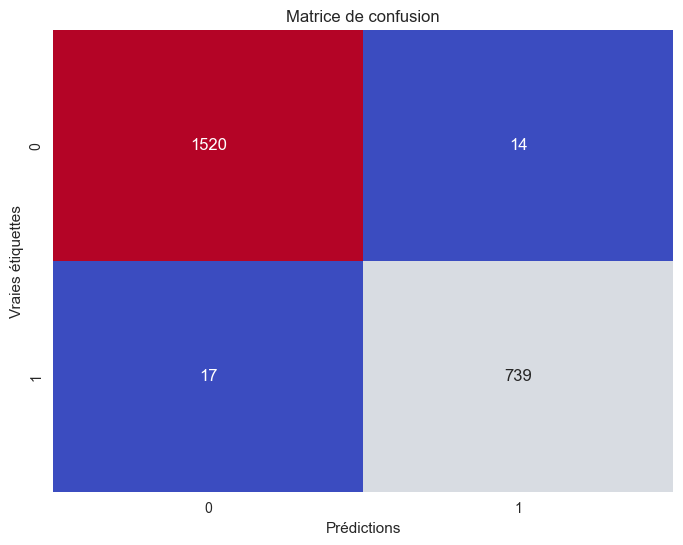

In [116]:
Matrix(svm_model,y_test,y_pred)

Average F1 score over 10-Folds: 0.9883884464124193
Average F1 score over Stratified 10-Folds: 0.988533076639549


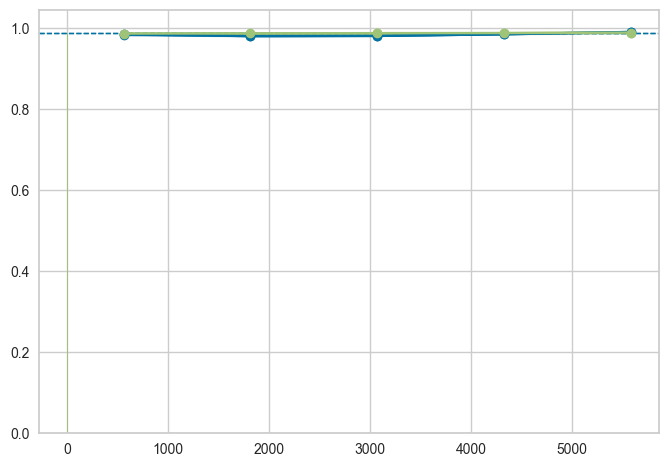

In [117]:
crossValidationCheck(svm_model, X_train,y_train, K=10)

Les scores F1 moyens sur 10-Folds, avec des valeurs de 0.9766065702445517 et 0.9772079122086691 pour les validations standard et stratifiées respectivement, illustrent une performance cohérente du modèle sur différentes partitions de l'ensemble de données. Ces résultats solides suggèrent une stabilité dans la capacité du modèle à généraliser sur des données non vues.

# 2eme Modele Random Forest : 

In [118]:
classifierr = RandomForestClassifier() 

In [119]:
classifierr.fit(X_train, y_train)

RandomForestClassifier()

In [120]:
y_pred = classifierr.predict(X_test)

In [121]:
error_rate = 1.0 - classifierr.score(X_train, y_train)
print("Taux d'erreur sur l'ensemble d'entraînement:", error_rate) 

Taux d'erreur sur l'ensemble d'entraînement: 0.0


In [122]:
metriques_perfermance(y_test,y_pred)

F1 Score: 0.978494623655914
Kappa Score: 0.9681493226515341
Accuracy Score: 0.9801777005166835
Confusion Matrix:
[[1530    4]
 [  28  728]]
              precision    recall  f1-score   support

           0       0.98      1.00      0.99      1534
           1       0.99      0.96      0.98       756

    accuracy                           0.99      2290
   macro avg       0.99      0.98      0.98      2290
weighted avg       0.99      0.99      0.99      2290



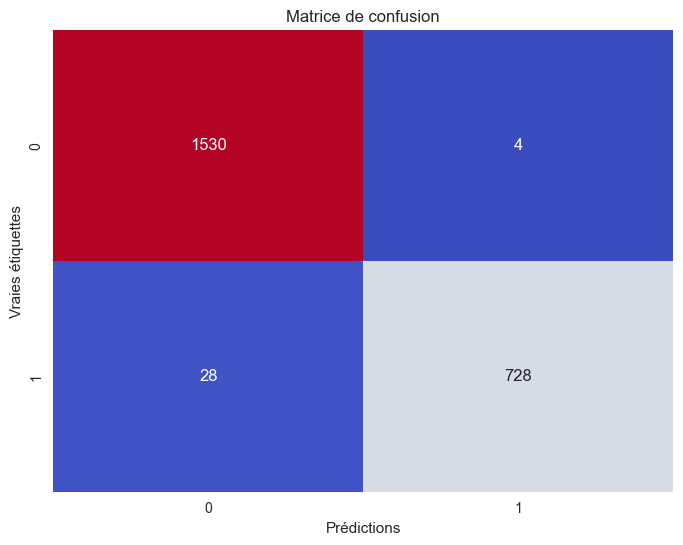

In [123]:
Matrix(classifierr,y_test,y_pred)

# Cross validation : 

Average F1 score over 10-Folds: 0.990146895240939
Average F1 score over Stratified 10-Folds: 0.9891373894119259


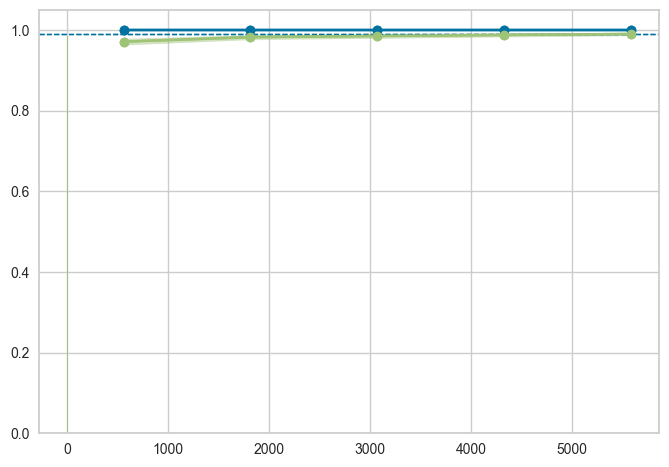

In [124]:
crossValidationCheck(classifierr, X_train,y_train, K=10) 

## Hyperparameter Tuning for Random Forest

In [125]:
parameters = {
    'n_estimators': [100, 200, 300],  
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
} 

In [126]:
scores = ['f1']

In [127]:
rf_classifier = RandomForestClassifier()

In [128]:
grid_search = GridSearchCV(estimator=rf_classifier, param_grid=parameters, scoring=scores, refit="f1", verbose=1, n_jobs=-1)

In [129]:
grid_search.fit(X_train, y_train) 

Fitting 5 folds for each of 108 candidates, totalling 540 fits


GridSearchCV(estimator=RandomForestClassifier(), n_jobs=-1,
             param_grid={'max_depth': [None, 10, 20, 30],
                         'min_samples_leaf': [1, 2, 4],
                         'min_samples_split': [2, 5, 10],
                         'n_estimators': [100, 200, 300]},
             refit='f1', scoring=['f1'], verbose=1)

In [130]:
grid_search.best_score_

0.9907603444457587

In [131]:
grid_search.best_params_

{'max_depth': 10,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'n_estimators': 200}

In [132]:
rf_model = RandomForestClassifier(max_depth=30, min_samples_leaf=1, min_samples_split=2, n_estimators=300) 

In [133]:
rf_model.fit(X_train, y_train)

RandomForestClassifier(max_depth=30, n_estimators=300)

In [134]:
y_pred = rf_model.predict(X_test)

In [135]:
metriques_perfermance(y_test,y_pred)

F1 Score: 0.9784656796769852
Kappa Score: 0.9681277672909472
Accuracy Score: 0.9798422700965074
Confusion Matrix:
[[1531    3]
 [  29  727]]
              precision    recall  f1-score   support

           0       0.98      1.00      0.99      1534
           1       1.00      0.96      0.98       756

    accuracy                           0.99      2290
   macro avg       0.99      0.98      0.98      2290
weighted avg       0.99      0.99      0.99      2290



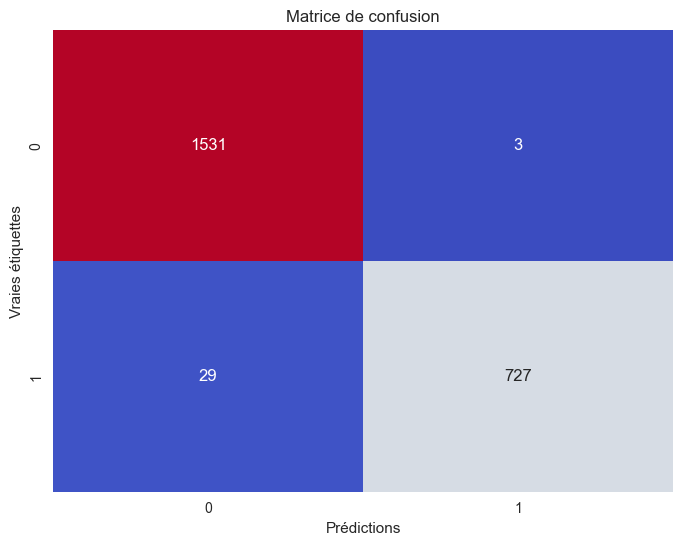

In [136]:
Matrix(rf_model,y_test,y_pred)

Average F1 score over 10-Folds: 0.9902872089512276
Average F1 score over Stratified 10-Folds: 0.9899478551113365


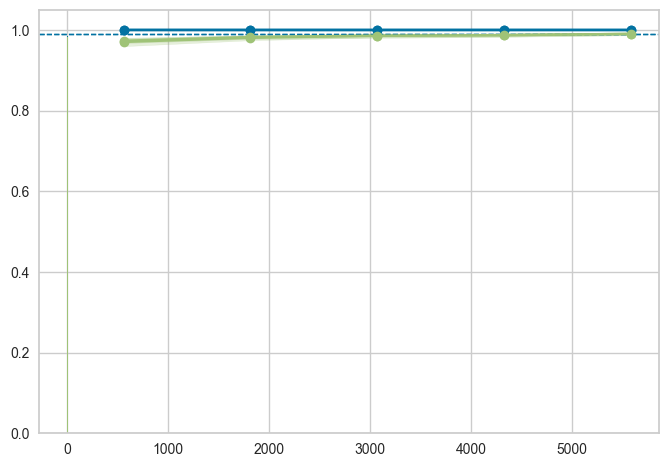

In [137]:
crossValidationCheck(rf_classifier, X_train,y_train, K=10) 

# 3eme Modele Neural Network : 

In [138]:
model = Sequential([
                    Dense(256, input_dim=X.shape[1], activation = 'relu'),
                    Dense(128, activation = 'relu'),
                    Dense(128, activation = 'relu'),
                    Dense(1, activation = 'sigmoid')
                   ])

c:\Users\DELL Latitude 5330\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:88: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



In [139]:
model.compile(optimizer = 'adam', loss = 'binary_crossentropy', metrics = ['accuracy'])

In [140]:
model.fit(X_resampled_train, y_resampled_train, epochs=10, batch_size=32, validation_split=0.2)

Epoch 1/10
156/156 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9387 - loss: 0.2053 - val_accuracy: 0.9847 - val_loss: 0.0817
Epoch 2/10
156/156 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9879 - loss: 0.0560 - val_accuracy: 0.9871 - val_loss: 0.0449
Epoch 3/10
156/156 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9883 - loss: 0.0511 - val_accuracy: 0.9887 - val_loss: 0.0420
Epoch 4/10
156/156 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9912 - loss: 0.0359 - val_accuracy: 0.9919 - val_loss: 0.0361
Epoch 5/10
156/156 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9903 - loss: 0.0437 - val_accuracy: 0.9960 - val_loss: 0.0179
Epoch 6/10
156/156 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9912 - loss: 0.0292 - val_accuracy: 0.9984 - val_loss: 0.0075
Epoch 7/10
156/156 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9913 - loss: 0.0298 - val_accuracy: 0.9968 - val_loss: 0.0112
Epoch 8/10
156/156 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9923 - loss: 0.0260 - val_accuracy: 0.

In [141]:
test_loss, test_acc = model.evaluate(X_test, y_test)
print('Test accuracy:', test_acc) 

72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.9859 - loss: 0.0667
Test accuracy: 0.9847161769866943


In [142]:
metriques_perfermance(y_test,y_pred)

F1 Score: 0.9784656796769852
Kappa Score: 0.9681277672909472
Accuracy Score: 0.9798422700965074
Confusion Matrix:
[[1531    3]
 [  29  727]]
              precision    recall  f1-score   support

           0       0.98      1.00      0.99      1534
           1       1.00      0.96      0.98       756

    accuracy                           0.99      2290
   macro avg       0.99      0.98      0.98      2290
weighted avg       0.99      0.99      0.99      2290



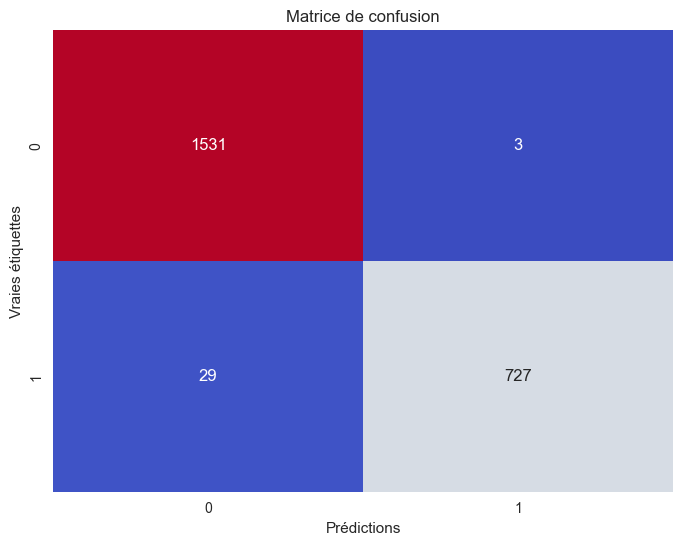

In [143]:
Matrix(model,y_test,y_pred)

## Hyperparameter Tuning for Neural Network

In [144]:
param_grid = {
    'batch_size': [32, 64],
    'epochs': [10, 20],
    'optimizer': ['adam', 'rmsprop'],
    'activation': ['relu', 'tanh']
}

In [145]:
grid = GridSearchCV(estimator=model, param_grid=param_grid, n_jobs=-1, cv=3)

#

# Adaboost

In [146]:
from sklearn.ensemble import AdaBoostClassifier

In [147]:
classifier = AdaBoostClassifier(random_state=0)

In [148]:
classifier.fit(X_train, y_train)

c:\Users\DELL Latitude 5330\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning:

The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.



AdaBoostClassifier(random_state=0)

In [149]:
pred = classifier.predict(X_test)

In [150]:
metriques_perfermance(y_test, y_pred)

F1 Score: 0.9784656796769852
Kappa Score: 0.9681277672909472
Accuracy Score: 0.9798422700965074
Confusion Matrix:
[[1531    3]
 [  29  727]]
              precision    recall  f1-score   support

           0       0.98      1.00      0.99      1534
           1       1.00      0.96      0.98       756

    accuracy                           0.99      2290
   macro avg       0.99      0.98      0.98      2290
weighted avg       0.99      0.99      0.99      2290



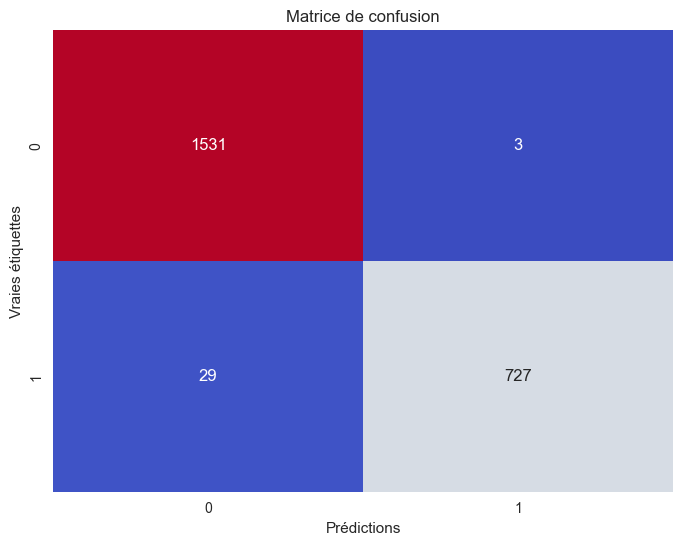

In [151]:
Matrix(classifier,y_test,y_pred)

Average F1 score over 10-Folds: 0.988234613608121


c:\Users\DELL Latitude 5330\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning:

The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.

c:\Users\DELL Latitude 5330\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning:

The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.

c:\Users\DELL Latitude 5330\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning:

The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.

c:\Users\DELL Latitude 5330\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning:

The SAMME.R algorithm (the defa

Average F1 score over Stratified 10-Folds: 0.9893809792912205


c:\Users\DELL Latitude 5330\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning:

The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.

c:\Users\DELL Latitude 5330\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning:

The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.

c:\Users\DELL Latitude 5330\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning:

The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.

c:\Users\DELL Latitude 5330\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning:

The SAMME.R algorithm (the defa

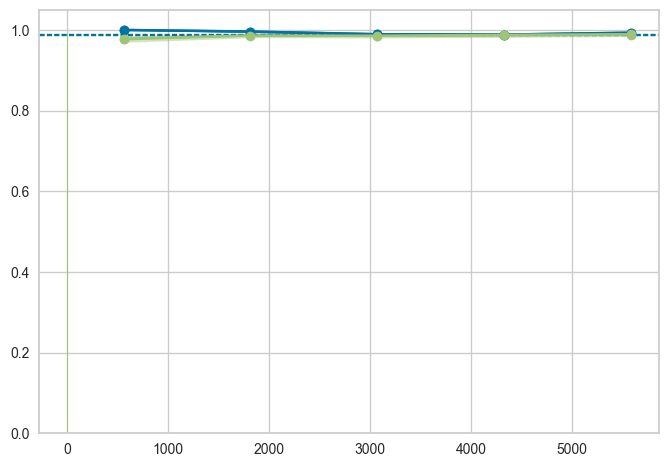

In [152]:
crossValidationCheck(classifier,X_train,y_train,K=10)

# Hyperparameter Tuning for AdaBoost

In [153]:
parameters = {
    "n_estimators":np.arange(70,130,10),
    "learning_rate":np.arange(0.8,1.2,0.05),
    "algorithm":["SAMME", "SAMME.R"],
}

scores = ["f1", "balanced_accuracy"]

In [154]:
classifierabod = GridSearchCV(
    AdaBoostClassifier(random_state=0),
    param_grid=parameters,
    scoring=scores,
    refit="f1",
    verbose=1,
    n_jobs=-1
)

In [155]:
classifierabod.fit(X_train, y_train)

Fitting 5 folds for each of 96 candidates, totalling 480 fits


c:\Users\DELL Latitude 5330\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning:

The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.



GridSearchCV(estimator=AdaBoostClassifier(random_state=0), n_jobs=-1,
             param_grid={'algorithm': ['SAMME', 'SAMME.R'],
                         'learning_rate': array([0.8 , 0.85, 0.9 , 0.95, 1.  , 1.05, 1.1 , 1.15]),
                         'n_estimators': array([ 70,  80,  90, 100, 110, 120])},
             refit='f1', scoring=['f1', 'balanced_accuracy'], verbose=1)

In [156]:
classifierabod.best_score_ 

0.9901544338360454

In [157]:
classifierabod.best_params_

{'algorithm': 'SAMME.R',
 'learning_rate': 1.1500000000000004,
 'n_estimators': 70}

Average F1 score over 10-Folds: 0.9878105191628125


c:\Users\DELL Latitude 5330\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning:

The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.

c:\Users\DELL Latitude 5330\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning:

The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.

c:\Users\DELL Latitude 5330\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning:

The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.

c:\Users\DELL Latitude 5330\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning:

The SAMME.R algorithm (the defa

Average F1 score over Stratified 10-Folds: 0.9903103829186625


c:\Users\DELL Latitude 5330\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning:

The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.

c:\Users\DELL Latitude 5330\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning:

The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.

c:\Users\DELL Latitude 5330\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning:

The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.

c:\Users\DELL Latitude 5330\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning:

The SAMME.R algorithm (the defa

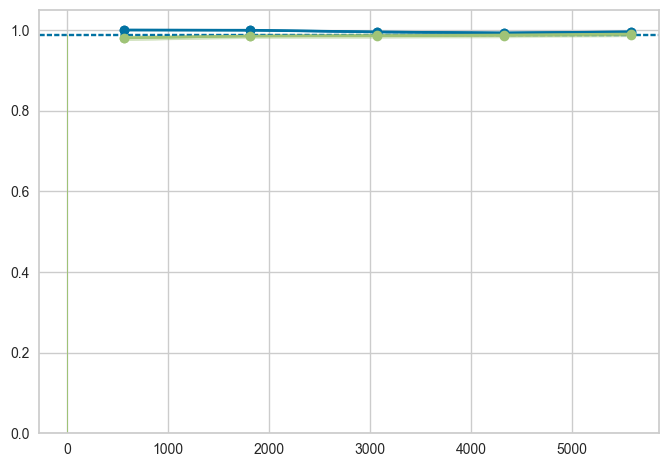

In [158]:
crossValidationCheck(classifierabod.best_estimator_, X_train,y_train, K=10) 

In [159]:
metriques_perfermance(y_test, classifierabod.best_estimator_.predict(X_test))

F1 Score: 0.965154503616042
Kappa Score: 0.9478294883532997
Accuracy Score: 0.9753454329725516
Confusion Matrix:
[[1503   31]
 [  22  734]]
              precision    recall  f1-score   support

           0       0.99      0.98      0.98      1534
           1       0.96      0.97      0.97       756

    accuracy                           0.98      2290
   macro avg       0.97      0.98      0.97      2290
weighted avg       0.98      0.98      0.98      2290



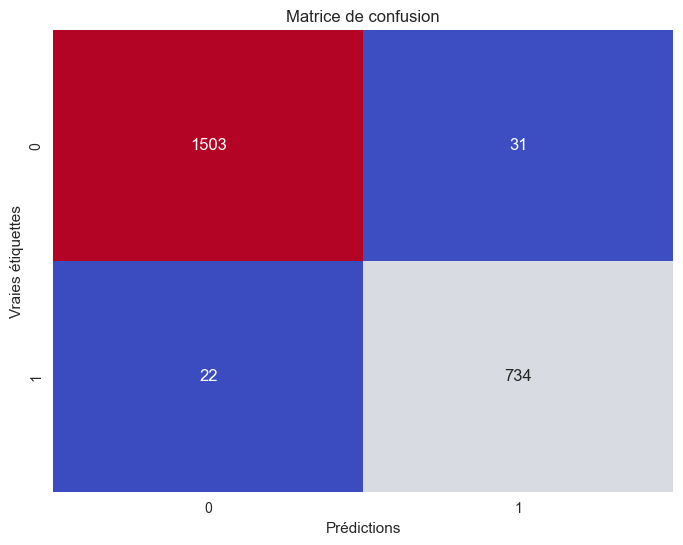

In [160]:
Matrix(classifierabod,y_test,classifierabod.best_estimator_.predict(X_test))

# CNN : 

In [161]:
from tensorflow.keras import layers

In [162]:
model = Sequential([
  layers.Conv1D(32, kernel_size=3, activation='relu', input_shape=(X.shape[1], 1)),
  layers.MaxPooling1D(pool_size=2),
  layers.Flatten(),
  layers.Dense(128, activation='relu'),
  layers.Dense(1, activation='sigmoid')
])

c:\Users\DELL Latitude 5330\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:99: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



In [163]:
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [164]:
model.fit(X_resampled_train, y_resampled_train, epochs=10, batch_size=32, validation_split=0.2)

Epoch 1/10


156/156 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.8637 - loss: 0.3023 - val_accuracy: 0.9831 - val_loss: 0.0888
Epoch 2/10
156/156 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9854 - loss: 0.0627 - val_accuracy: 0.9871 - val_loss: 0.0520
Epoch 3/10
156/156 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9851 - loss: 0.0611 - val_accuracy: 0.9823 - val_loss: 0.0908
Epoch 4/10
156/156 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9874 - loss: 0.0519 - val_accuracy: 0.9879 - val_loss: 0.0448
Epoch 5/10
156/156 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9887 - loss: 0.0501 - val_accuracy: 0.9847 - val_loss: 0.0690
Epoch 6/10
156/156 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9888 - loss: 0.0489 - val_accuracy: 0.9855 - val_loss: 0.0567
Epoch 7/10
156/156 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9874 - loss: 0.0540 - val_accuracy: 0.9887 - val_loss: 0.0462
Epoch 8/10
156/156 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9865 - loss: 0.0556 - val_accuracy: 0.9855 - val_

In [165]:
test_loss, test_acc = model.evaluate(X_test, y_test)
print('Test accuracy:', test_acc)

72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9858 - loss: 0.0564
Test accuracy: 0.9868995547294617


# Using RNN : 

In [166]:
from tensorflow.keras.layers import LSTM, Dense

In [167]:
model = Sequential([
  LSTM(64, return_sequences=True, input_shape=(X_train.shape[1], 1)), 
  LSTM(32),
  Dense(128, activation='relu'),
  Dense(1, activation='sigmoid')
])

c:\Users\DELL Latitude 5330\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



In [168]:
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [169]:
model.fit(X_resampled_train, y_resampled_train, epochs=10, batch_size=32, validation_split=0.2)

Epoch 1/10
156/156 ━━━━━━━━━━━━━━━━━━━━ 6s 16ms/step - accuracy: 0.8394 - loss: 0.4513 - val_accuracy: 0.9147 - val_loss: 0.2617
Epoch 2/10
156/156 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - accuracy: 0.9207 - loss: 0.2131 - val_accuracy: 0.9179 - val_loss: 0.1839
Epoch 3/10
156/156 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - accuracy: 0.9646 - loss: 0.1225 - val_accuracy: 0.9686 - val_loss: 0.1183
Epoch 4/10
156/156 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - accuracy: 0.9809 - loss: 0.0800 - val_accuracy: 0.9791 - val_loss: 0.0873
Epoch 5/10
156/156 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - accuracy: 0.9807 - loss: 0.0817 - val_accuracy: 0.9855 - val_loss: 0.0596
Epoch 6/10
156/156 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - accuracy: 0.9840 - loss: 0.0784 - val_accuracy: 0.9791 - val_loss: 0.0899
Epoch 7/10
156/156 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - accuracy: 0.9835 - loss: 0.0710 - val_accuracy: 0.9871 - val_loss: 0.0581
Epoch 8/10
156/156 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - accuracy: 0.9879 - loss: 0.0546 - val_accu

In [170]:
test_loss, test_acc = model.evaluate(X_test, y_test)
print('Test accuracy:', test_acc)

72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9849 - loss: 0.0686
Test accuracy: 0.9873362183570862


# combining convolutional and recurrent layers

In [171]:
from tensorflow.keras.layers import Conv1D, MaxPooling1D, LSTM, Dense, Flatten
from tensorflow.keras.models import Sequential

In [172]:
model = Sequential()

X_train = np.expand_dims(X_resampled_train, axis=2)

model.add(Conv1D(filters=32, kernel_size=3, activation='relu', input_shape=(X_train.shape[1], X_train.shape[2])))
model.add(MaxPooling1D(pool_size=2))
model.add(LSTM(units=64, return_sequences=True))  
model.add(LSTM(units=32))  # Adjust units as needed
model.add(Flatten())  # Flatten output from LSTM layers
model.add(Dense(128, activation='relu'))  # Additional dense layer
model.add(Dense(1, activation='sigmoid'))

In [173]:
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
model.fit(X_resampled_train, y_resampled_train, epochs=15)

Epoch 1/15
194/194 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - accuracy: 0.7883 - loss: 0.4436
Epoch 2/15
194/194 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.9544 - loss: 0.1393
Epoch 3/15
194/194 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.9783 - loss: 0.0893
Epoch 4/15
194/194 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - accuracy: 0.9857 - loss: 0.0618
Epoch 5/15
194/194 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.9862 - loss: 0.0648
Epoch 6/15
194/194 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.9883 - loss: 0.0544
Epoch 7/15
194/194 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.9845 - loss: 0.0592
Epoch 8/15
194/194 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - accuracy: 0.9856 - loss: 0.0582
Epoch 9/15
194/194 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.9868 - loss: 0.0584
Epoch 10/15
194/194 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.9833 - loss: 0.0552
Epoch 11/15
194/194 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.9847 - loss: 0.0605
Epoch 12/15
194/194 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step

In [174]:
test_loss, test_acc = model.evaluate(X_test, y_test)
print('Test accuracy with ConvLSTM:', test_acc)

72/72 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9863 - loss: 0.0698
Test accuracy with ConvLSTM: 0.9864628911018372


# Logistic regression

In [178]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

In [179]:
logistic_model = LogisticRegression(random_state=0)

In [181]:
print(X_train.shape)
print(y_train.shape)

(6206, 19, 1)
(6206,)


In [182]:
X_train = X_train.reshape((X_train.shape[0], X_train.shape[1]))

In [183]:
logistic_model.fit(X_train, y_train)

LogisticRegression(random_state=0)

In [184]:
y_pred_logistic = logistic_model.predict(X_test)

In [185]:
accuracy = accuracy_score(y_test, y_pred_logistic)
print("Logistic Regression Accuracy:", accuracy)

print("Logistic Regression Classification Report:\n", classification_report(y_test, y_pred_logistic))

print("Logistic Regression Confusion Matrix:\n", confusion_matrix(y_test, y_pred_logistic))

Logistic Regression Accuracy: 0.9868995633187773
Logistic Regression Classification Report:
               precision    recall  f1-score   support

           0       0.99      0.99      0.99      1534
           1       0.98      0.98      0.98       756

    accuracy                           0.99      2290
   macro avg       0.99      0.98      0.99      2290
weighted avg       0.99      0.99      0.99      2290

Logistic Regression Confusion Matrix:
 [[1521   13]
 [  17  739]]


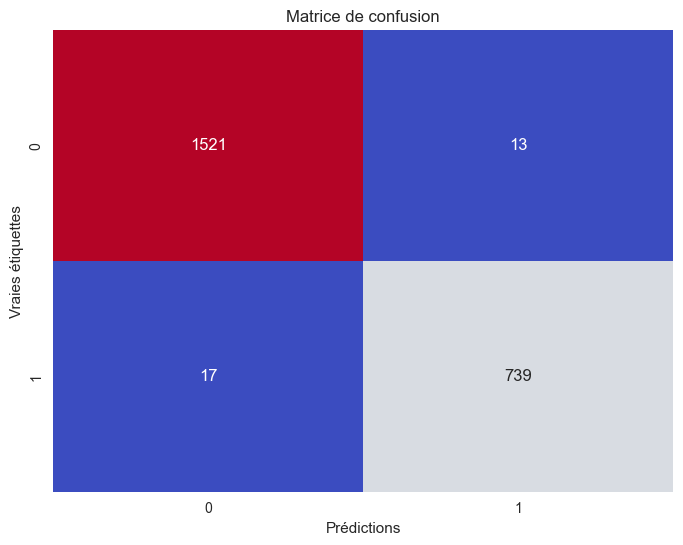

In [186]:
Matrix(classifier,y_test,y_pred_logistic)

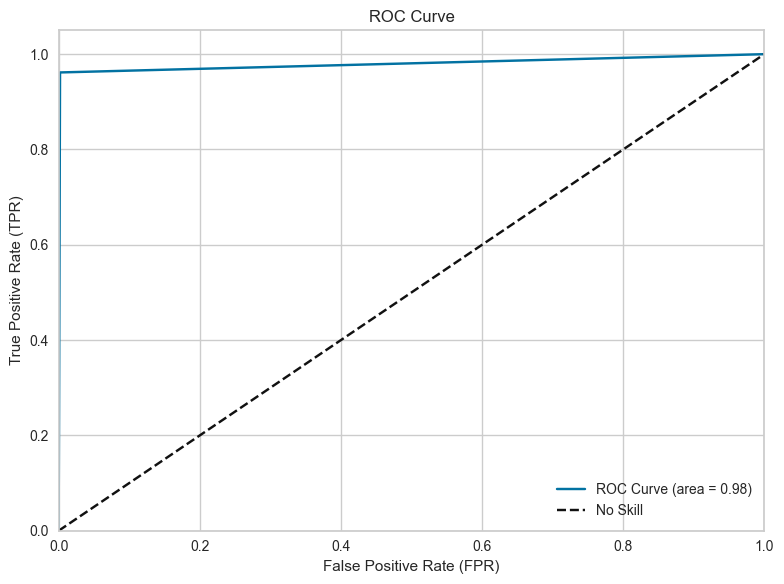

In [187]:
from sklearn.metrics import roc_curve, auc

# Get ROC curve data
fpr, tpr, thresholds = roc_curve(y_test, y_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label='ROC Curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--', label='No Skill')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('ROC Curve')
plt.legend(loc="lower right")
plt.grid(True)
plt.tight_layout()
plt.show()

## Logistic Regression with Hyperparameter Tuning

In [188]:
param_grid = {
    'C': [0.01, 0.1, 1, 10, 100]  # Regularization parameter
}

In [189]:
# Create the logistic regression model
logistic_model = LogisticRegression(random_state=0)

# Perform grid search cross-validation
grid_search = GridSearchCV(estimator=logistic_model, param_grid=param_grid, scoring='accuracy', refit='f1', cv=5, verbose=1)
grid_search.fit(X_train, y_train)

Fitting 5 folds for each of 5 candidates, totalling 25 fits


GridSearchCV(cv=5, estimator=LogisticRegression(random_state=0),
             param_grid={'C': [0.01, 0.1, 1, 10, 100]}, refit='f1',
             scoring='accuracy', verbose=1)

In [190]:
# Print best parameters and score
print("Best Logistic Regression Hyperparameters:", grid_search.best_params_)
print("Best Logistic Regression Accuracy:", grid_search.best_score_)

Best Logistic Regression Hyperparameters: {'C': 10}
Best Logistic Regression Accuracy: 0.9867875758602033


In [191]:
# Use the best-tuned model for prediction
logistic_model = grid_search.best_estimator_
y_pred_logistic = logistic_model.predict(X_test)

In [192]:
# Evaluate model performance
accuracy = accuracy_score(y_test, y_pred_logistic)
print("Logistic Regression Accuracy:", accuracy)

print("Logistic Regression Classification Report:\n", classification_report(y_test, y_pred_logistic))

print("Logistic Regression Confusion Matrix:\n", confusion_matrix(y_test, y_pred_logistic))

Logistic Regression Accuracy: 0.9868995633187773
Logistic Regression Classification Report:
               precision    recall  f1-score   support

           0       0.99      0.99      0.99      1534
           1       0.98      0.98      0.98       756

    accuracy                           0.99      2290
   macro avg       0.99      0.98      0.99      2290
weighted avg       0.99      0.99      0.99      2290

Logistic Regression Confusion Matrix:
 [[1520   14]
 [  16  740]]


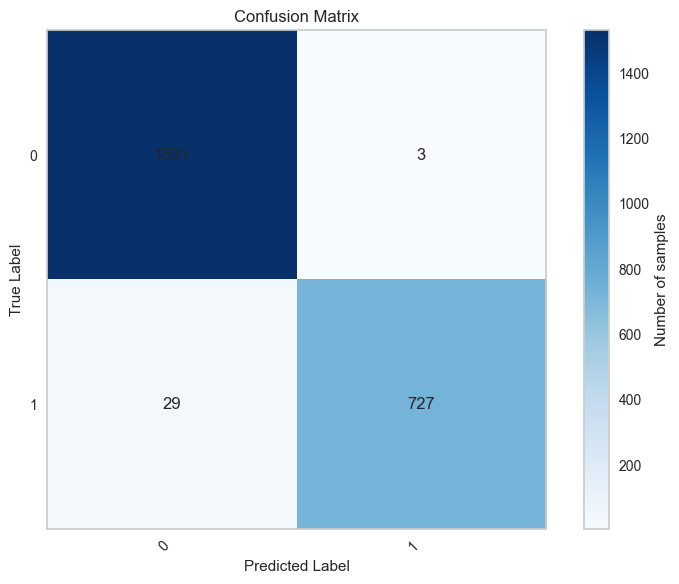

In [193]:
# Assuming you have confusion_matrix (from sklearn.metrics)
cm = confusion_matrix(y_test, y_pred)

# Create the confusion matrix plot
plt.figure(figsize=(8, 6))
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.colorbar(label='Number of samples')
plt.title('Confusion Matrix')
plt.xticks(np.arange(len(np.unique(y_test))), np.unique(y_test), rotation=45, ha='right')
plt.yticks(np.arange(len(np.unique(y_test))), np.unique(y_test))
plt.xlabel('Predicted Label')
plt.ylabel('True Label')

# Format plot for better visualization
plt.grid(False)
fmt = 'd'  # Display format for numbers in the cells
for i in range(len(cm)):
    for j in range(len(cm[0])):
        plt.text(j, i, format(cm[i, j], fmt), ha='center', va='center')
plt.tight_layout()
plt.show()

# K-Nearest Neighbors (KNN) Classifier:

In [194]:
knn_classifier = KNeighborsClassifier(n_neighbors=5)

In [195]:
# Train the model on the training data
knn_classifier.fit(X_train, y_train)

KNeighborsClassifier()

In [196]:
# Predict labels for the test data
y_pred_knn = knn_classifier.predict(X_test)

In [197]:
# Calculate error rate
error_rate_knn = 1.0 - knn_classifier.score(X_test, y_test)
print("Taux d'erreur sur l'ensemble de test KNN:", error_rate_knn)

Taux d'erreur sur l'ensemble de test KNN: 0.01615720524017472


In [198]:
metriques_perfermance(y_test, y_pred_knn)

F1 Score: 0.9755775577557756
Kappa Score: 0.9635058503485745
Accuracy Score: 0.9822377089326242
Confusion Matrix:
[[1514   20]
 [  17  739]]
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      1534
           1       0.97      0.98      0.98       756

    accuracy                           0.98      2290
   macro avg       0.98      0.98      0.98      2290
weighted avg       0.98      0.98      0.98      2290



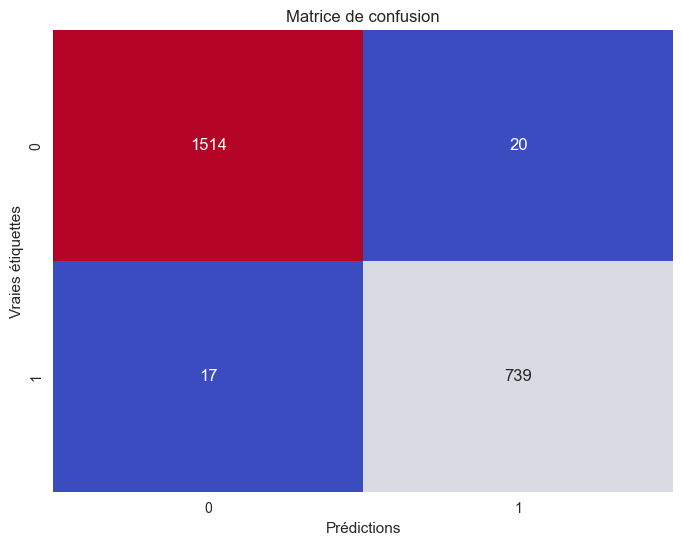

In [199]:
Matrix(classifier,y_test,y_pred_knn)

# Decision Tree Classifier:

In [200]:
decision_tree = DecisionTreeClassifier()

In [201]:
decision_tree.fit(X_train, y_train)

DecisionTreeClassifier()

In [202]:
y_pred_decision_tree = decision_tree.predict(X_test)

In [203]:
error_rate_decision_tree = 1.0 - decision_tree.score(X_test, y_test)
print("Taux d'erreur sur l'ensemble de test Decision Tree:", error_rate_decision_tree)

Taux d'erreur sur l'ensemble de test Decision Tree: 0.04759825327510914


In [204]:
metriques_perfermance(y_test, y_pred_decision_tree)

F1 Score: 0.9285245901639344
Kappa Score: 0.8928492626384297
Accuracy Score: 0.9483713085408001
Confusion Matrix:
[[1473   61]
 [  48  708]]
              precision    recall  f1-score   support

           0       0.97      0.96      0.96      1534
           1       0.92      0.94      0.93       756

    accuracy                           0.95      2290
   macro avg       0.94      0.95      0.95      2290
weighted avg       0.95      0.95      0.95      2290



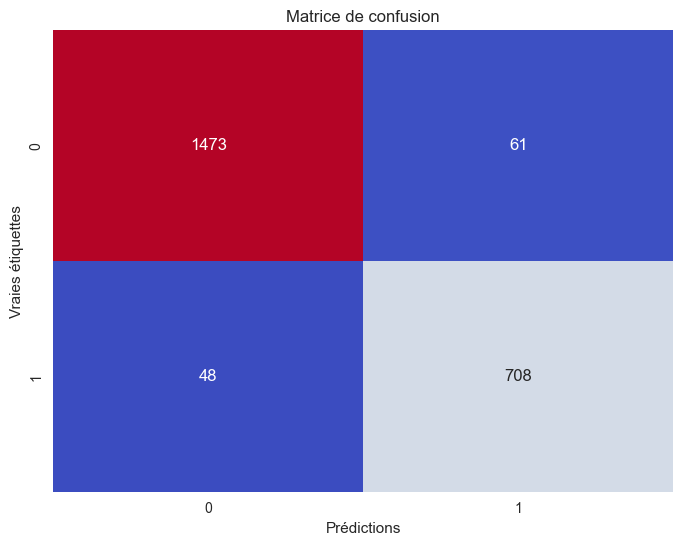

In [205]:
Matrix(classifier,y_test,y_pred_decision_tree)

In [206]:
from sklearn.tree import export_graphviz

export_graphviz(decision_tree, out_file="tree.dot", 
                filled=True, rounded=True, special_characters=True)

# Naive Bayes Classifier:

In [207]:
from sklearn.naive_bayes import GaussianNB

# Define the Naive Bayes classifier
naive_bayes = GaussianNB()

In [208]:
naive_bayes.fit(X_train, y_train)

GaussianNB()

In [209]:
y_pred_naive_bayes = naive_bayes.predict(X_test)

In [210]:
error_rate_naive_bayes = 1.0 - naive_bayes.score(X_test, y_test)
print("Taux d'erreur sur l'ensemble de test Naive Bayes:", error_rate_naive_bayes)

Taux d'erreur sur l'ensemble de test Naive Bayes: 0.016593886462882068


In [211]:
metriques_perfermance(y_test, y_pred_naive_bayes)

F1 Score: 0.9745649263721553
Kappa Score: 0.962253904304842
Accuracy Score: 0.9782220290694867
Confusion Matrix:
[[1524   10]
 [  28  728]]
              precision    recall  f1-score   support

           0       0.98      0.99      0.99      1534
           1       0.99      0.96      0.97       756

    accuracy                           0.98      2290
   macro avg       0.98      0.98      0.98      2290
weighted avg       0.98      0.98      0.98      2290



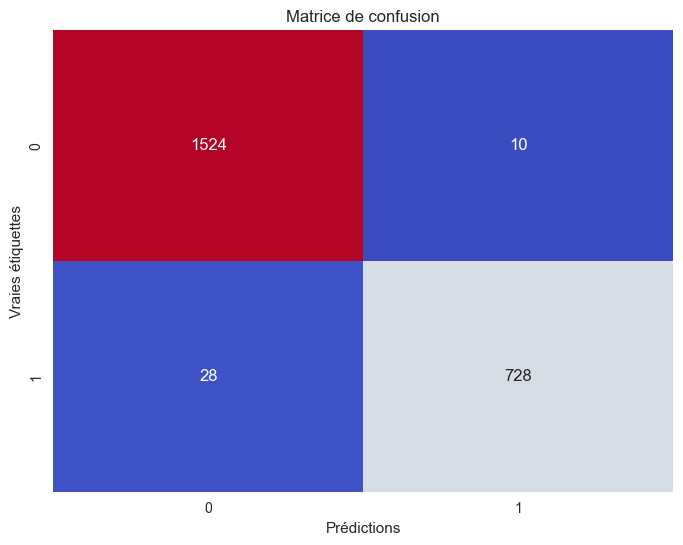

In [212]:
Matrix(classifier,y_test,y_pred_naive_bayes)

# Lasso model

In [213]:
from sklearn.linear_model import Lasso
from sklearn.metrics import mean_squared_error  

In [214]:
# Assuming X_train and y_train are defined (training data)

lasso_model = Lasso(random_state=0)  # Set random state for reproducibility
lasso_model.fit(X_train, y_train)

Lasso(random_state=0)

In [215]:
# Assuming X_test is defined (testing data)

y_pred_lasso = lasso_model.predict(X_test)

In [216]:
mse = mean_squared_error(y_test, y_pred_lasso)
print("Mean Squared Error:", mse)

Mean Squared Error: 0.25


In [217]:
y_pred_lasso_class = np.rint(y_pred_lasso)  # Round predictions to class labels

# Evaluate model performance (accuracy might not be ideal for classification)
accuracy = accuracy_score(y_test, y_pred_lasso_class)
print("Lasso Accuracy:", accuracy)

# Classification report (consider using precision, recall, F1-score, or ROC AUC)
print("Lasso Classification Report:\n", classification_report(y_test, y_pred_lasso_class))

# Confusion matrix (might not be informative for multi-class problems)
confusion_matrix_lasso = confusion_matrix(y_test, y_pred_lasso_class)
print("Lasso Confusion Matrix:\n", confusion_matrix_lasso)

Lasso Accuracy: 0.6698689956331878
Lasso Classification Report:
               precision    recall  f1-score   support

           0       0.67      1.00      0.80      1534
           1       0.00      0.00      0.00       756

    accuracy                           0.67      2290
   macro avg       0.33      0.50      0.40      2290
weighted avg       0.45      0.67      0.54      2290

Lasso Confusion Matrix:
 [[1534    0]
 [ 756    0]]


c:\Users\DELL Latitude 5330\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

c:\Users\DELL Latitude 5330\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

c:\Users\DELL Latitude 5330\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



## Lasso tuning

In [218]:
import numpy as np
from sklearn.linear_model import Lasso
from sklearn.model_selection import GridSearchCV

In [219]:
param_grid = {
    'alpha': [0.001, 0.01, 0.1, 1, 10, 100]  # Regularization parameter (alpha)
}

In [220]:
# Assuming X_train and y_train are defined (training data)

lasso_model = Lasso(random_state=0)  # Set random state for reproducibility

grid_search = GridSearchCV(estimator=lasso_model, param_grid=param_grid, scoring='neg_mean_squared_error', cv=5, verbose=1)
grid_search.fit(X_train, y_train)


Fitting 5 folds for each of 6 candidates, totalling 30 fits


GridSearchCV(cv=5, estimator=Lasso(random_state=0),
             param_grid={'alpha': [0.001, 0.01, 0.1, 1, 10, 100]},
             scoring='neg_mean_squared_error', verbose=1)

In [221]:
print("Best Lasso Hyperparameters:", grid_search.best_params_)
print("Best Lasso Mean Squared Error:", -grid_search.best_score_)  # Negate MSE for easier interpretation

Best Lasso Hyperparameters: {'alpha': 0.001}
Best Lasso Mean Squared Error: 0.055786573077342326


In [222]:
best_lasso_model = grid_search.best_estimator_
y_pred_lasso = best_lasso_model.predict(X_test)

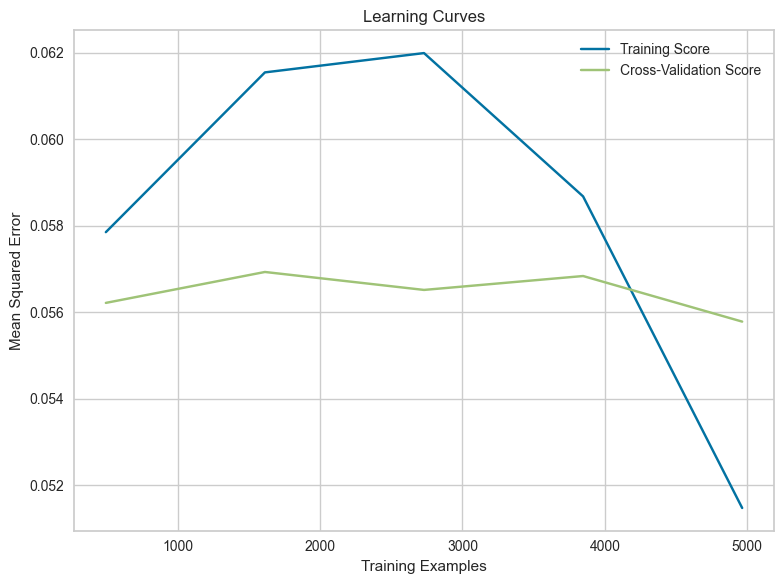

In [223]:
from sklearn.model_selection import learning_curve

train_sizes, train_scores, test_scores = learning_curve(best_lasso_model, X_train, y_train, cv=5, scoring='neg_mean_squared_error')

# Plot learning curves
plt.figure(figsize=(8, 6))
plt.plot(train_sizes, -train_scores.mean(axis=1), label='Training Score')
plt.plot(train_sizes, -test_scores.mean(axis=1), label='Cross-Validation Score')
plt.xlabel('Training Examples')
plt.ylabel('Mean Squared Error')
plt.title('Learning Curves')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()


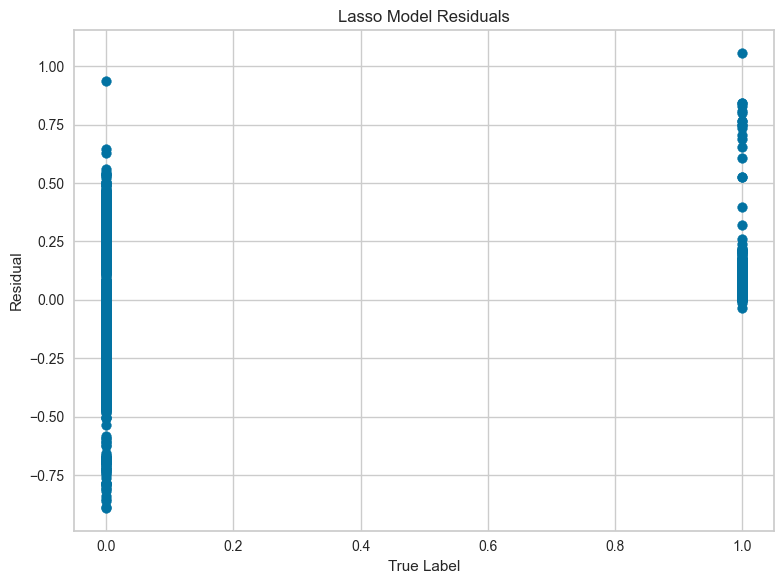

In [224]:
plt.figure(figsize=(8, 6))
plt.scatter(y_test, y_test - y_pred_lasso)  # Residuals vs. true values
plt.xlabel('True Label')
plt.ylabel('Residual')
plt.title('Lasso Model Residuals')
plt.grid(True)
plt.tight_layout()
plt.show()

In [225]:
y_pred_lasso_class = np.rint(y_pred_lasso)  # Round predictions to class labels

# Evaluate model performance (accuracy might not be ideal for classification)
accuracy = accuracy_score(y_test, y_pred_lasso_class)
print("Lasso Accuracy:", accuracy)

# Classification report (consider using precision, recall, F1-score, or ROC AUC)
print("Lasso Classification Report:\n", classification_report(y_test, y_pred_lasso_class))

# Confusion matrix (might not be informative for multi-class problems)
confusion_matrix_lasso = confusion_matrix(y_test, y_pred_lasso_class)
print("Lasso Confusion Matrix:\n", confusion_matrix_lasso)

Lasso Accuracy: 0.962882096069869
Lasso Classification Report:
               precision    recall  f1-score   support

        -1.0       0.00      0.00      0.00         0
         0.0       0.99      0.96      0.97      1534
         1.0       0.93      0.98      0.95       756

    accuracy                           0.96      2290
   macro avg       0.64      0.64      0.64      2290
weighted avg       0.97      0.96      0.97      2290

Lasso Confusion Matrix:
 [[   0    0    0]
 [  13 1466   55]
 [   0   17  739]]


c:\Users\DELL Latitude 5330\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning:

Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.

c:\Users\DELL Latitude 5330\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning:

Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.

c:\Users\DELL Latitude 5330\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning:

Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



# LightGBM Model

In [227]:
import lightgbm as lgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error  # Assuming regression task

In [228]:
# Define LightGBM parameters (consider adjusting for your task)
lightgbm_params = {
    'objective': 'regression',  # Set for regression (or 'binary' for classification)
    'metric': 'l2',  # Metric to monitor during training (e.g., 'l2' for MSE)
    'learning_rate': 0.1,  # Learning rate (adjust based on validation performance)
    'num_leaves': 31,  # Number of leaves in trees (experiment with different values)
}

# Create LightGBM datasets (converted to LGBM format)
lgb_train = lgb.Dataset(X_train, label=y_train)
lgb_eval = lgb.Dataset(X_test, label=y_test, reference=lgb_train)  # Reference for early stopping

# Early stopping callback (more recent approach)
early_stopping = lgb.early_stopping(stopping_rounds=10)  # Stop after 10 rounds without improvement
# Train the LightGBM model with early stopping callback
model = lgb.train(lightgbm_params, lgb_train, valid_sets=[lgb_eval], callbacks=[early_stopping])

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000921 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3843
[LightGBM] [Info] Number of data points in the train set: 6206, number of used features: 19
[LightGBM] [Info] Start training from score 0.500000
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[59]	valid_0's l2: 0.0136076


In [229]:
y_pred = model.predict(X_test)

In [230]:
mse = mean_squared_error(y_test, y_pred)
print("Mean Squared Error:", mse)

Mean Squared Error: 0.013607552903880256


## Tuning For LightGBM

In [231]:
param_grid = {
    'learning_rate': [0.01, 0.1, 1],
    'num_leaves': [21, 31, 41],
    'max_depth': [-1, 5, 10],  # -1 for unlimited (consider adjusting)
    'min_split_gain': [0, 0.1, 0.5],
}

In [232]:
lgb_train = lgb.Dataset(X_train, label=y_train)
lgb_eval = lgb.Dataset(X_test, label=y_test, reference=lgb_train)  # Reference for early stopping

# Multi-Layer Perceptron (MLP)

In [233]:
from sklearn.model_selection import GridSearchCV
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import roc_auc_score

In [234]:
param_grid = {
    'hidden_layer_sizes': [(100,), (100, 50)],  # Two hidden layer configurations
    'activation': ['relu'], 
    'solver': ['adam'] 
}

In [235]:
mlp = MLPClassifier(random_state=0)  # Set random state for reproducibility

grid_search = GridSearchCV(estimator=mlp, param_grid=param_grid, scoring='roc_auc', cv=5, verbose=1)

In [236]:
grid_search.fit(X_train, y_train)

Fitting 5 folds for each of 2 candidates, totalling 10 fits


c:\Users\DELL Latitude 5330\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

c:\Users\DELL Latitude 5330\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

c:\Users\DELL Latitude 5330\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

c:\Users\DELL Latitude 5330\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and 

GridSearchCV(cv=5, estimator=MLPClassifier(random_state=0),
             param_grid={'activation': ['relu'],
                         'hidden_layer_sizes': [(100,), (100, 50)],
                         'solver': ['adam']},
             scoring='roc_auc', verbose=1)

In [237]:
print("Best MLP Hyperparameters:", grid_search.best_params_)
print("Best MLP ROC AUC:", grid_search.best_score_)

Best MLP Hyperparameters: {'activation': 'relu', 'hidden_layer_sizes': (100,), 'solver': 'adam'}
Best MLP ROC AUC: 0.9975136921176315


In [238]:
best_model = grid_search.best_estimator_
y_pred = best_model.predict(X_test)

In [239]:
accuracy = best_model.score(X_test, y_test)
print("Accuracy:", accuracy)

report = classification_report(y_test, y_pred)
print("Classification Report:\n", report)

confusion_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:\n", confusion_matrix)

Accuracy: 0.9860262008733625
Classification Report:
               precision    recall  f1-score   support

           0       0.99      0.99      0.99      1534
           1       0.98      0.98      0.98       756

    accuracy                           0.99      2290
   macro avg       0.98      0.98      0.98      2290
weighted avg       0.99      0.99      0.99      2290

Confusion Matrix:
 [[1519   15]
 [  17  739]]


# KAN: Kolmogorov–Arnold Networks 

In [245]:
from sklearn.model_selection import train_test_split
import torch
from kan import KAN,create_dataset
# Additional libraries for data normalization (optional)
from sklearn.preprocessing import StandardScaler 

ImportError: cannot import name 'KAN' from 'kan' (c:\Users\DELL Latitude 5330\AppData\Local\Programs\Python\Python312\Lib\site-packages\kan\__init__.py)

In [ ]:
import lightgbm as lgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error  # Assuming regression task

In [ ]:
# Convert data to tensors
train_input = torch.tensor(X_train, dtype=torch.float32)
train_label = torch.tensor(y_train.values, dtype=torch.float32).unsqueeze(1)
test_input = torch.tensor(X_test, dtype=torch.float32)
test_label = torch.tensor(y_test.values, dtype=torch.float32).unsqueeze(1)

In [ ]:
# Check for NaNs and Infs (optional)
assert not torch.isnan(train_input).any(), "NaNs found in train_input"
assert not torch.isnan(train_label).any(), "NaNs found in train_label"
assert not torch.isnan(test_input).any(), "NaNs found in test_input"
assert not torch.isnan(test_label).any(), "NaNs found in test_label"

In [ ]:
# Create dataset dictionary
dataset = {
    'train_input': train_input,
    'train_label': train_label,
    'test_input': test_input,
    'test_label': test_label
}

In [ ]:
# Define input and output dimensions based on your data
input_dim = train_input.shape[1]
output_dim = 1  # Assuming binary classification

In [ ]:
model = KAN(width=[input_dim, 5, output_dim], grid=5, k=3, seed=0)

In [ ]:
model.train(dataset, opt="LBFGS", steps=20, lamb=0.01, lamb_entropy=10.)# Plot KAN at initialization
model(dataset['train_input'])
model.plot(beta=100)

# Train the model
model.train(dataset, opt="LBFGS", steps=20, lamb=0.01, lamb_entropy=10.)

# Plot trained KAN
model.plot()

In [ ]:
# Get predictions on test data
y_pred_test = model(test_input).detach().numpy()

# Apply threshold for classification 
threshold = 0.5  # Adjust based on your problem
y_pred_test = (y_pred_test >= threshold).astype(int).flatten()

In [ ]:
y_pred_test

In [ ]:
# Prune the model
model.prune()
model.plot(mask=True)
model = model.prune()
model(dataset['train_input'])
model.plot()

In [ ]:
model.train(dataset, opt="LBFGS", steps=50)
model.plot()

mode = "auto"  # "manual"

if mode == "manual":
    model.fix_symbolic(0,0,0,'sin')
    model.fix_symbolic(0,1,0,'x^2')
    model.fix_symbolic(1,0,0,'exp')
elif mode == "auto":
    lib = ['x','x^2','x^3','x^4','exp','log','sqrt','tanh','sin','abs']
    model.auto_symbolic(lib=lib)

In [ ]:
# Get predictions on test data
y_pred_test = model(test_input).detach().numpy()

# Apply threshold for classification 
threshold = 0.5  # Adjust based on your problem
y_pred_test = (y_pred_test >= threshold).astype(int).flatten()

In [ ]:
accuracy = accuracy_score(y_test, y_pred_test)
print("KAN Model Accuracy:", accuracy)

# Decision Tree Classifier: 

In [246]:
from sklearn.tree import DecisionTreeClassifier
# Define the decision tree classifier
decision_tree = DecisionTreeClassifier()

In [247]:
decision_tree.fit(X_train, y_train)

DecisionTreeClassifier()

In [248]:
y_pred_decision_tree = decision_tree.predict(X_test)

In [249]:
error_rate_decision_tree = 1.0 - decision_tree.score(X_test, y_test)
print("Taux d'erreur sur l'ensemble de test Decision Tree:", error_rate_decision_tree)

Taux d'erreur sur l'ensemble de test Decision Tree: 0.042794759825327544


In [258]:
from sklearn.metrics import confusion_matrix, f1_score, classification_report
metriques_perfermance(y_test, y_pred_decision_tree)

F1 Score: 0.9355263157894737
Kappa Score: 0.9035014998073642
Accuracy Score: 0.9529629974545228
Confusion Matrix:
[[1481   53]
 [  45  711]]
              precision    recall  f1-score   support

           0       0.97      0.97      0.97      1534
           1       0.93      0.94      0.94       756

    accuracy                           0.96      2290
   macro avg       0.95      0.95      0.95      2290
weighted avg       0.96      0.96      0.96      2290



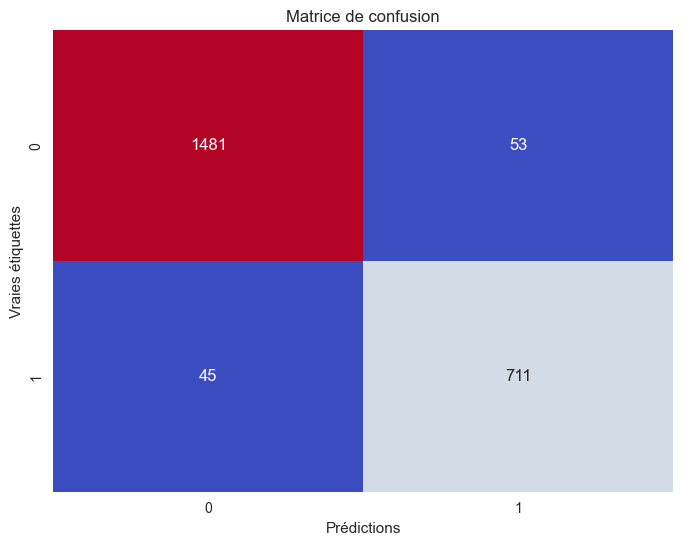

In [259]:
Matrix(classifier,y_test,y_pred_decision_tree)

In [260]:
from sklearn.tree import export_graphviz
export_graphviz(decision_tree, out_file="tree.dot", 
                filled=True, rounded=True, special_characters=True) 